In [2]:
# ============================================================
# WILCOXON MODEL COMPARISON — STEP 1
# LOCATE AVAILABLE REPEAT-LEVEL SUMMARY FILES
#
# PURPOSE:
#   - Point the notebook to the folder containing the
#     repeated cross-validation summary CSV files.
#   - List the CSV files available in that folder.
#   - No statistical test is performed in this step.
# ============================================================

from pathlib import Path


# ============================================================
# 1. DATA DIRECTORY
# ============================================================

WILCOXON_DATA_DIR = Path(
    r"C:\Users\kwsta\OneDrive\Desktop\Desetation project"
    r"\brain-tumour-mri-classification\Wilcoxon test data"
)


# Check that the folder exists before continuing.
assert WILCOXON_DATA_DIR.exists(), (
    "Wilcoxon data directory was not found:\n"
    f"{WILCOXON_DATA_DIR}"
)


# ============================================================
# 2. FIND CSV FILES
# ============================================================

summary_files = sorted(
    WILCOXON_DATA_DIR.glob("*.csv")
)


# ============================================================
# 3. DISPLAY AVAILABLE FILES
# ============================================================

print("=" * 80)
print("WILCOXON MODEL COMPARISON — AVAILABLE SUMMARY FILES")
print("=" * 80)

print("\nData directory:")
print(WILCOXON_DATA_DIR)

print("\nCSV files found:", len(summary_files))

for index, file_path in enumerate(
    summary_files,
    start=1,
):
    print(
        f"{index:02d}. {file_path.name}"
    )


print("\nWILCOXON STEP 1: PASSED")

WILCOXON MODEL COMPARISON — AVAILABLE SUMMARY FILES

Data directory:
C:\Users\kwsta\OneDrive\Desktop\Desetation project\brain-tumour-mri-classification\Wilcoxon test data

CSV files found: 8
01. repeat_level_summary_efficientnetb0+rf.csv
02. repeat_level_summary_efficientnetb0+svm.csv
03. repeat_level_summary_efficientnetb0.csv
04. repeat_level_summary_hog_glcm_rf.csv
05. repeat_level_summary_hog_glcm_svm.csv
06. repeat_level_summary_resnet50+rf.csv
07. repeat_level_summary_resnet50+svm.csv
08. repeat_level_summary_resnet50.csv

WILCOXON STEP 1: PASSED


In [3]:
# ============================================================
# WILCOXON MODEL COMPARISON — STEP 2
# STATISTICAL CONFIGURATION
#
# PURPOSE:
#   - Define the eight model configurations.
#   - Define the significance level.
#   - Define the Wilcoxon signed-rank test settings.
#   - Create all possible pairwise comparisons.
#
# With 8 models:
#
#       C(8, 2) = 28 comparisons
#
# No model performance data are loaded in this step.
# ============================================================

import sys
from itertools import combinations

import numpy as np
import pandas as pd
import scipy

from scipy.stats import wilcoxon


# ============================================================
# 1. MODEL NAMES
# ============================================================

MODEL_NAMES = [

    "HOG+GLCM + SVM",

    "HOG+GLCM + RF",

    "ResNet50 End-to-End",

    "EfficientNetB0 End-to-End",

    "ResNet50 Features + SVM",

    "ResNet50 Features + RF",

    "EfficientNetB0 Features + SVM",

    "EfficientNetB0 Features + RF",
]


# Confirm that exactly eight unique models are present.
assert len(MODEL_NAMES) == 8

assert len(set(MODEL_NAMES)) == 8


# ============================================================
# 2. SIGNIFICANCE LEVEL
# ============================================================

ALPHA = 0.05


assert 0.0 < ALPHA < 1.0


# ============================================================
# 3. WILCOXON TEST SETTINGS
#
# alternative="two-sided":
#   Tests whether the paired differences differ from zero
#   in either direction.
#
# zero_method="wilcox":
#   Exact zero differences are excluded from the signed-rank
#   calculation.
#
# method="auto":
#   SciPy selects the appropriate calculation method.
# ============================================================

WILCOXON_ALTERNATIVE = "two-sided"

WILCOXON_ZERO_METHOD = "wilcox"

WILCOXON_PVALUE_METHOD = "auto"


# ============================================================
# 4. CREATE ALL PAIRWISE MODEL COMPARISONS
# ============================================================

PAIRWISE_COMPARISONS = list(
    combinations(
        MODEL_NAMES,
        2,
    )
)


# Eight models should produce exactly 28 different pairs.
assert len(PAIRWISE_COMPARISONS) == 28


# ============================================================
# 5. CREATE COMPARISON PLAN TABLE
# ============================================================

comparison_plan_df = pd.DataFrame(
    [
        {
            "comparison_id": comparison_number,
            "model_a": model_a,
            "model_b": model_b,
        }

        for (
            comparison_number,
            (
                model_a,
                model_b,
            ),
        ) in enumerate(
            PAIRWISE_COMPARISONS,
            start=1,
        )
    ]
)


assert len(comparison_plan_df) == 28


# ============================================================
# 6. DISPLAY CONFIGURATION
# ============================================================

print("=" * 100)
print("WILCOXON MODEL COMPARISON — STATISTICAL CONFIGURATION")
print("=" * 100)

print("\nPython version:")
print(sys.version.split()[0])

print("\nSciPy version:")
print(scipy.__version__)

print("\nNumber of models:")
print(len(MODEL_NAMES))

print("\nNumber of pairwise comparisons:")
print(len(PAIRWISE_COMPARISONS))

print("\nSignificance level:")
print(ALPHA)

print("\nWilcoxon alternative:")
print(WILCOXON_ALTERNATIVE)

print("\nWilcoxon zero method:")
print(WILCOXON_ZERO_METHOD)

print("\nWilcoxon p-value method:")
print(WILCOXON_PVALUE_METHOD)


print("\n" + "=" * 100)
print("PAIRWISE COMPARISON PLAN")
print("=" * 100)

print(
    comparison_plan_df.to_string(
        index=False
    )
)


print("\nWILCOXON STEP 2: PASSED")

WILCOXON MODEL COMPARISON — STATISTICAL CONFIGURATION

Python version:
3.11.9

SciPy version:
1.12.0

Number of models:
8

Number of pairwise comparisons:
28

Significance level:
0.05

Wilcoxon alternative:
two-sided

Wilcoxon zero method:
wilcox

Wilcoxon p-value method:
auto

PAIRWISE COMPARISON PLAN
 comparison_id                       model_a                       model_b
             1                HOG+GLCM + SVM                 HOG+GLCM + RF
             2                HOG+GLCM + SVM           ResNet50 End-to-End
             3                HOG+GLCM + SVM     EfficientNetB0 End-to-End
             4                HOG+GLCM + SVM       ResNet50 Features + SVM
             5                HOG+GLCM + SVM        ResNet50 Features + RF
             6                HOG+GLCM + SVM EfficientNetB0 Features + SVM
             7                HOG+GLCM + SVM  EfficientNetB0 Features + RF
             8                 HOG+GLCM + RF           ResNet50 End-to-End
             9       

In [4]:
# ============================================================
# WILCOXON MODEL COMPARISON — STEP 3
# LOAD AND VALIDATE ALL 8 REPEAT-LEVEL SUMMARY FILES
#
# PURPOSE:
#   - Load the repeated cross-validation results.
#   - Extract the 10 repeat-level mean macro F1 values
#     from each model.
#   - Confirm repeats 1-10 are present exactly once.
#   - Build a paired table containing all eight models.
#
# IMPORTANT:
#   - Each Wilcoxon test uses 10 paired observations.
#   - Each observation is the mean macro F1 across the
#     five outer folds of one repeat.
#   - The 50 individual folds are not treated as separate
#     Wilcoxon observations.
# ============================================================


# ============================================================
# 1. MODEL FILE MAPPING
# ============================================================

MODEL_FILES = {

    "HOG+GLCM + SVM":
        "repeat_level_summary_hog_glcm_svm.csv",

    "HOG+GLCM + RF":
        "repeat_level_summary_hog_glcm_rf.csv",

    "ResNet50 End-to-End":
        "repeat_level_summary_resnet50.csv",

    "EfficientNetB0 End-to-End":
        "repeat_level_summary_efficientnetb0.csv",

    "ResNet50 Features + SVM":
        "repeat_level_summary_resnet50+svm.csv",

    "ResNet50 Features + RF":
        "repeat_level_summary_resnet50+rf.csv",

    "EfficientNetB0 Features + SVM":
        "repeat_level_summary_efficientnetb0+svm.csv",

    "EfficientNetB0 Features + RF":
        "repeat_level_summary_efficientnetb0+rf.csv",
}


assert len(MODEL_FILES) == 8

assert set(MODEL_FILES.keys()) == set(MODEL_NAMES)


# ============================================================
# 2. EXPECTED REPEAT NUMBERS
# ============================================================

EXPECTED_REPEATS = list(
    range(
        1,
        11,
    )
)


# ============================================================
# 3. LOAD AND VALIDATE EACH MODEL
# ============================================================

validated_model_scores = {}


for model_name, file_name in MODEL_FILES.items():

    file_path = (
        WILCOXON_DATA_DIR
        / file_name
    )


    # --------------------------------------------------------
    # Check that the required file exists.
    # --------------------------------------------------------

    assert file_path.exists(), (
        f"Missing file for {model_name}:\n"
        f"{file_path}"
    )


    model_df = pd.read_csv(
        file_path
    )


    # --------------------------------------------------------
    # Each model must contain exactly 10 repeat-level rows.
    # --------------------------------------------------------

    assert len(model_df) == 10, (
        f"{model_name}: expected 10 rows, "
        f"found {len(model_df)}."
    )


    # --------------------------------------------------------
    # A repeat column is required.
    # --------------------------------------------------------

    assert "repeat" in model_df.columns, (
        f"{model_name}: repeat column not found."
    )


    # --------------------------------------------------------
    # Identify the column containing the repeat-level
    # macro F1 value.
    # --------------------------------------------------------

    if "mean_macro_f1" in model_df.columns:

        score_column = "mean_macro_f1"

    elif "wilcoxon_value" in model_df.columns:

        score_column = "wilcoxon_value"

    else:

        raise KeyError(
            f"{model_name}: macro F1 column not found.\n"
            f"Columns: {model_df.columns.tolist()}"
        )


    # --------------------------------------------------------
    # Keep only repeat number and macro F1.
    # --------------------------------------------------------

    model_scores_df = model_df[
        [
            "repeat",
            score_column,
        ]
    ].copy()


    model_scores_df.columns = [
        "repeat",
        "mean_macro_f1",
    ]


    # --------------------------------------------------------
    # Convert both columns to numeric values.
    # --------------------------------------------------------

    model_scores_df["repeat"] = pd.to_numeric(
        model_scores_df["repeat"],
        errors="raise",
    ).astype(int)


    model_scores_df["mean_macro_f1"] = pd.to_numeric(
        model_scores_df["mean_macro_f1"],
        errors="raise",
    ).astype(float)


    # --------------------------------------------------------
    # Sort repeats so R1-R10 are in the same order
    # for every model.
    # --------------------------------------------------------

    model_scores_df = (
        model_scores_df
        .sort_values("repeat")
        .reset_index(drop=True)
    )


    # --------------------------------------------------------
    # Confirm repeats 1-10 are present exactly once.
    # --------------------------------------------------------

    assert (
        model_scores_df["repeat"].tolist()
        == EXPECTED_REPEATS
    ), (
        f"{model_name}: expected repeats 1-10."
    )


    assert (
        model_scores_df["repeat"].nunique()
        == 10
    )


    # --------------------------------------------------------
    # Validate the macro F1 values.
    # --------------------------------------------------------

    scores = model_scores_df[
        "mean_macro_f1"
    ].to_numpy(
        dtype=float
    )


    assert np.isfinite(scores).all()

    assert (
        (scores >= 0.0)
        &
        (scores <= 1.0)
    ).all()


    validated_model_scores[
        model_name
    ] = model_scores_df


    print(
        f"PASSED | {model_name}"
        f" | mean = {scores.mean():.6f}"
        f" | SD = {scores.std(ddof=1):.6f}"
    )


# ============================================================
# 4. BUILD THE PAIRED 10 × 8 PERFORMANCE TABLE
# ============================================================

repeat_performance_matrix = pd.DataFrame(
    {
        "repeat": EXPECTED_REPEATS
    }
)


for model_name in MODEL_NAMES:

    model_df = (
        validated_model_scores[
            model_name
        ]
        .rename(
            columns={
                "mean_macro_f1":
                    model_name
            }
        )
    )


    repeat_performance_matrix = (
        repeat_performance_matrix
        .merge(
            model_df,
            on="repeat",
            how="left",
            validate="one_to_one",
        )
    )


# ============================================================
# 5. VALIDATE THE COMPLETE TABLE
# ============================================================

assert repeat_performance_matrix.shape == (
    10,
    9,
)


assert not (
    repeat_performance_matrix
    .isna()
    .any()
    .any()
)


# ============================================================
# 6. DISPLAY THE WILCOXON INPUT DATA
# ============================================================

print("\n" + "=" * 120)
print("PAIRED REPEAT-LEVEL MACRO F1 TABLE")
print("=" * 120)

print(
    repeat_performance_matrix
    .round(6)
    .to_string(
        index=False
    )
)


print("\nRows:", 10)
print("Models:", 8)

print(
    "\nPairing:"
    "\nR1 with R1, R2 with R2, ..., R10 with R10"
)

print("\nWILCOXON STEP 3: PASSED")

PASSED | HOG+GLCM + SVM | mean = 0.913683 | SD = 0.001242
PASSED | HOG+GLCM + RF | mean = 0.863589 | SD = 0.002122
PASSED | ResNet50 End-to-End | mean = 0.954234 | SD = 0.005850
PASSED | EfficientNetB0 End-to-End | mean = 0.953467 | SD = 0.002573
PASSED | ResNet50 Features + SVM | mean = 0.956987 | SD = 0.001365
PASSED | ResNet50 Features + RF | mean = 0.918032 | SD = 0.001797
PASSED | EfficientNetB0 Features + SVM | mean = 0.963586 | SD = 0.001268
PASSED | EfficientNetB0 Features + RF | mean = 0.917327 | SD = 0.002199

PAIRED REPEAT-LEVEL MACRO F1 TABLE
 repeat  HOG+GLCM + SVM  HOG+GLCM + RF  ResNet50 End-to-End  EfficientNetB0 End-to-End  ResNet50 Features + SVM  ResNet50 Features + RF  EfficientNetB0 Features + SVM  EfficientNetB0 Features + RF
      1        0.912827       0.864413             0.953605                   0.950996                 0.956219                0.917183                       0.962451                      0.918670
      2        0.912157       0.858740       

In [6]:
# ============================================================
# WILCOXON MODEL COMPARISON — STEP 4
# CALCULATE PAIRED DIFFERENCES FOR ALL 28 MODEL PAIRS
#
# PURPOSE:
#   - Calculate the difference between Model A and Model B
#     for every repeat.
#
#       difference =
#       Model A macro F1 - Model B macro F1
#
#   - Count how many repeats favour each model.
#   - Calculate the mean and median difference.
#
# No Wilcoxon test is performed in this step.
# ============================================================


# ============================================================
# 1. STORAGE
# ============================================================

paired_difference_records = []

pair_difference_summary_records = []


# ============================================================
# 2. PROCESS ALL 28 MODEL PAIRS
# ============================================================

for (
    comparison_id,
    (
        model_a,
        model_b,
    ),
) in enumerate(
    PAIRWISE_COMPARISONS,
    start=1,
):


    # --------------------------------------------------------
    # Extract the 10 paired repeat-level values.
    # --------------------------------------------------------

    scores_a = repeat_performance_matrix[
        model_a
    ].to_numpy(
        dtype=float
    )


    scores_b = repeat_performance_matrix[
        model_b
    ].to_numpy(
        dtype=float
    )


    assert scores_a.shape == (10,)
    assert scores_b.shape == (10,)


    # --------------------------------------------------------
    # Calculate Model A - Model B for each repeat.
    #
    # Positive value:
    #   Model A had the higher macro F1.
    #
    # Negative value:
    #   Model B had the higher macro F1.
    #
    # Zero:
    #   Both models had the same macro F1.
    # --------------------------------------------------------

    differences = np.round(
        scores_a - scores_b,
        decimals=12,
    )


    assert differences.shape == (10,)
    assert np.isfinite(differences).all()


    # --------------------------------------------------------
    # Save the difference for every individual repeat.
    # --------------------------------------------------------

    for repeat_number in EXPECTED_REPEATS:

        index = repeat_number - 1

        paired_difference_records.append(
            {
                "comparison_id":
                    comparison_id,

                "model_a":
                    model_a,

                "model_b":
                    model_b,

                "repeat":
                    repeat_number,

                "model_a_macro_f1":
                    float(scores_a[index]),

                "model_b_macro_f1":
                    float(scores_b[index]),

                "difference_a_minus_b":
                    float(differences[index]),
            }
        )


    # --------------------------------------------------------
    # Count the direction of the differences.
    # --------------------------------------------------------

    n_positive = int(
        np.sum(
            differences > 0
        )
    )

    n_negative = int(
        np.sum(
            differences < 0
        )
    )

    n_zero = int(
        np.sum(
            differences == 0
        )
    )


    assert (
        n_positive
        + n_negative
        + n_zero
    ) == 10


    # --------------------------------------------------------
    # Store a summary for this model comparison.
    # --------------------------------------------------------

    pair_difference_summary_records.append(
        {
            "comparison_id":
                comparison_id,

            "model_a":
                model_a,

            "model_b":
                model_b,

            "mean_difference_a_minus_b":
                float(
                    np.mean(differences)
                ),

            "median_difference_a_minus_b":
                float(
                    np.median(differences)
                ),

            "a_higher_repeats":
                n_positive,

            "b_higher_repeats":
                n_negative,

            "equal_repeats":
                n_zero,
        }
    )


# ============================================================
# 3. CREATE RESULTS TABLES
# ============================================================

paired_differences_df = pd.DataFrame(
    paired_difference_records
)


pair_difference_summary_df = pd.DataFrame(
    pair_difference_summary_records
)


# ============================================================
# 4. VALIDATE RESULTS
# ============================================================

assert len(
    paired_differences_df
) == 280


assert len(
    pair_difference_summary_df
) == 28


assert (
    paired_differences_df
    .groupby("comparison_id")
    .size()
    .eq(10)
    .all()
)


# ============================================================
# 5. DISPLAY SUMMARY
# ============================================================

print("=" * 120)
print("PAIRWISE DIFFERENCE SUMMARY")
print("=" * 120)

print(
    pair_difference_summary_df
    .round(6)
    .to_string(
        index=False
    )
)


print(
    "\nNumber of model comparisons:",
    len(pair_difference_summary_df)
)

print(
    "Paired observations per comparison:",
    10
)

print("\nWILCOXON STEP 4: PASSED")

PAIRWISE DIFFERENCE SUMMARY
 comparison_id                       model_a                       model_b  mean_difference_a_minus_b  median_difference_a_minus_b  a_higher_repeats  b_higher_repeats  equal_repeats
             1                HOG+GLCM + SVM                 HOG+GLCM + RF                   0.050094                     0.049952                10                 0              0
             2                HOG+GLCM + SVM           ResNet50 End-to-End                  -0.040551                    -0.040753                 0                10              0
             3                HOG+GLCM + SVM     EfficientNetB0 End-to-End                  -0.039784                    -0.038856                 0                10              0
             4                HOG+GLCM + SVM       ResNet50 Features + SVM                  -0.043304                    -0.043201                 0                10              0
             5                HOG+GLCM + SVM        ResNet50 F

In [7]:
# ============================================================
# WILCOXON MODEL COMPARISON — STEP 5
# RUN ALL 28 PAIRED WILCOXON SIGNED-RANK TESTS
#
# PURPOSE:
#   - Run one two-sided Wilcoxon signed-rank test for
#     every pair of models.
#
# INPUT:
#   - 10 paired repeat-level macro F1 differences for
#     each model pair.
#
# H0:
#   The paired differences are centred at zero.
#
# H1:
#   The paired differences are not centred at zero.
#
# The significance level is 0.05.
# ============================================================


# ============================================================
# 1. STORAGE
# ============================================================

wilcoxon_result_records = []


# ============================================================
# 2. RUN ALL 28 TESTS
# ============================================================

for (
    comparison_id,
    (
        model_a,
        model_b,
    ),
) in enumerate(
    PAIRWISE_COMPARISONS,
    start=1,
):


    # --------------------------------------------------------
    # Retrieve the 10 paired differences calculated
    # in Step 4.
    # --------------------------------------------------------

    comparison_differences = (
        paired_differences_df[
            paired_differences_df[
                "comparison_id"
            ]
            == comparison_id
        ]
        .sort_values("repeat")[
            "difference_a_minus_b"
        ]
        .to_numpy(
            dtype=float
        )
    )


    assert comparison_differences.shape == (10,)

    assert np.isfinite(
        comparison_differences
    ).all()


    # --------------------------------------------------------
    # Count which model was higher across the 10 repeats.
    # --------------------------------------------------------

    n_positive = int(
        np.sum(
            comparison_differences > 0
        )
    )

    n_negative = int(
        np.sum(
            comparison_differences < 0
        )
    )

    n_zero = int(
        np.sum(
            comparison_differences == 0
        )
    )


    # --------------------------------------------------------
    # Run the Wilcoxon signed-rank test.
    # --------------------------------------------------------

    test_result = wilcoxon(

        comparison_differences,

        alternative=
            WILCOXON_ALTERNATIVE,

        zero_method=
            WILCOXON_ZERO_METHOD,

        method=
            WILCOXON_PVALUE_METHOD,
    )


    wilcoxon_statistic = float(
        test_result.statistic
    )

    p_value = float(
        test_result.pvalue
    )


    # --------------------------------------------------------
    # Calculate descriptive differences between the models.
    # --------------------------------------------------------

    mean_difference = float(
        np.mean(
            comparison_differences
        )
    )


    median_difference = float(
        np.median(
            comparison_differences
        )
    )


    # --------------------------------------------------------
    # Identify which model has the higher average
    # repeat-level macro F1.
    # --------------------------------------------------------

    if mean_difference > 0:

        higher_mean_model = model_a

    elif mean_difference < 0:

        higher_mean_model = model_b

    else:

        higher_mean_model = "Equal"


    # --------------------------------------------------------
    # Check whether the p-value is below 0.05.
    # --------------------------------------------------------

    p_below_0_05 = bool(
        p_value < ALPHA
    )


    # --------------------------------------------------------
    # Save the result.
    # --------------------------------------------------------

    wilcoxon_result_records.append(
        {
            "comparison_id":
                comparison_id,

            "model_a":
                model_a,

            "model_b":
                model_b,

            "n_pairs":
                10,

            "model_a_higher_repeats":
                n_positive,

            "model_b_higher_repeats":
                n_negative,

            "equal_repeats":
                n_zero,

            "mean_difference_a_minus_b":
                mean_difference,

            "median_difference_a_minus_b":
                median_difference,

            "higher_mean_model":
                higher_mean_model,

            "wilcoxon_W":
                wilcoxon_statistic,

            "p_value":
                p_value,

            "p_below_0_05":
                p_below_0_05,
        }
    )


# ============================================================
# 3. CREATE RESULTS TABLE
# ============================================================

wilcoxon_results_df = pd.DataFrame(
    wilcoxon_result_records
)


# ============================================================
# 4. VALIDATE RESULTS
# ============================================================

assert len(
    wilcoxon_results_df
) == 28


assert (
    wilcoxon_results_df[
        "comparison_id"
    ].nunique()
    == 28
)


assert (
    wilcoxon_results_df[
        "n_pairs"
    ].eq(10).all()
)


assert (
    (
        wilcoxon_results_df[
            "p_value"
        ] >= 0.0
    )
    &
    (
        wilcoxon_results_df[
            "p_value"
        ] <= 1.0
    )
).all()


# ============================================================
# 5. DISPLAY ALL RESULTS
# ============================================================

print("=" * 140)
print("WILCOXON SIGNED-RANK TEST — PAIRWISE RESULTS")
print("=" * 140)

print(
    "\nNumber of model comparisons:",
    len(wilcoxon_results_df)
)

print(
    "Paired observations per comparison:",
    10
)

print(
    "Significance level:",
    ALPHA
)


display_columns = [

    "comparison_id",

    "model_a",

    "model_b",

    "model_a_higher_repeats",

    "model_b_higher_repeats",

    "mean_difference_a_minus_b",

    "wilcoxon_W",

    "p_value",

    "p_below_0_05",
]


print("\n" + "=" * 140)

print(
    wilcoxon_results_df[
        display_columns
    ]
    .round(
        {
            "mean_difference_a_minus_b":
                6,

            "wilcoxon_W":
                3,

            "p_value":
                6,
        }
    )
    .to_string(
        index=False
    )
)


# ============================================================
# 6. COUNT RESULTS BELOW 0.05
# ============================================================

number_below_0_05 = int(
    wilcoxon_results_df[
        "p_below_0_05"
    ].sum()
)


print(
    "\nComparisons with p < 0.05:",
    number_below_0_05,
    "/ 28"
)


print("\nWILCOXON STEP 5: PASSED")

WILCOXON SIGNED-RANK TEST — PAIRWISE RESULTS

Number of model comparisons: 28
Paired observations per comparison: 10
Significance level: 0.05

 comparison_id                       model_a                       model_b  model_a_higher_repeats  model_b_higher_repeats  mean_difference_a_minus_b  wilcoxon_W  p_value  p_below_0_05
             1                HOG+GLCM + SVM                 HOG+GLCM + RF                      10                       0                   0.050094         0.0 0.001953          True
             2                HOG+GLCM + SVM           ResNet50 End-to-End                       0                      10                  -0.040551         0.0 0.001953          True
             3                HOG+GLCM + SVM     EfficientNetB0 End-to-End                       0                      10                  -0.039784         0.0 0.001953          True
             4                HOG+GLCM + SVM       ResNet50 Features + SVM                       0                   

In [8]:
# ============================================================
# WILCOXON MODEL COMPARISON — STEP 6
# SAVE THE WILCOXON RESULTS
#
# PURPOSE:
#   - Save the complete pairwise Wilcoxon results.
#   - Save the repeat-level performance table used as
#     input to the statistical tests.
#   - Save the paired differences used by the tests.
# ============================================================


# ============================================================
# 1. OUTPUT DIRECTORY
# ============================================================

OUTPUT_DIR = (
    WILCOXON_DATA_DIR
    / "wilcoxon_results"
)


OUTPUT_DIR.mkdir(
    parents=True,
    exist_ok=True,
)


# ============================================================
# 2. SAVE REPEAT-LEVEL PERFORMANCE TABLE
# ============================================================

repeat_performance_matrix.to_csv(
    OUTPUT_DIR
    / "repeat_level_macro_f1.csv",
    index=False,
)


# ============================================================
# 3. SAVE PAIRED DIFFERENCES
# ============================================================

paired_differences_df.to_csv(
    OUTPUT_DIR
    / "pairwise_differences.csv",
    index=False,
)


# ============================================================
# 4. SAVE WILCOXON RESULTS
# ============================================================

wilcoxon_results_df.to_csv(
    OUTPUT_DIR
    / "wilcoxon_pairwise_results.csv",
    index=False,
)


# ============================================================
# 5. DISPLAY SAVED FILES
# ============================================================

print("=" * 90)
print("WILCOXON RESULTS SAVED")
print("=" * 90)

print("\nOutput folder:")
print(OUTPUT_DIR)

print("\nSaved files:")

print(
    "1. repeat_level_macro_f1.csv"
)

print(
    "2. pairwise_differences.csv"
)

print(
    "3. wilcoxon_pairwise_results.csv"
)

print("\nWILCOXON STEP 6: PASSED")

WILCOXON RESULTS SAVED

Output folder:
C:\Users\kwsta\OneDrive\Desktop\Desetation project\brain-tumour-mri-classification\Wilcoxon test data\wilcoxon_results

Saved files:
1. repeat_level_macro_f1.csv
2. pairwise_differences.csv
3. wilcoxon_pairwise_results.csv

WILCOXON STEP 6: PASSED


In [ ]:
# ============================================================
# WILCOXON GROUP COMPARISON
# HYBRID SVM GROUP vs HYBRID RF GROUP
#
# PURPOSE:
#   - Combine the two SVM-based hybrid models into one
#     repeat-level SVM group score.
#
#   - Combine the two RF-based hybrid models into one
#     repeat-level RF group score.
#
#   - Compare the two groups using a paired, two-sided
#     Wilcoxon signed-rank test.
#
# GROUP DEFINITIONS:
#
#   Hybrid SVM group:
#       ResNet50 Features + SVM
#       EfficientNetB0 Features + SVM
#
#   Hybrid RF group:
#       ResNet50 Features + RF
#       EfficientNetB0 Features + RF
#
# STATISTICAL UNIT:
#   One paired observation per repeated-CV repeat.
#
#   Therefore:
#       N = 10 paired repeat-level group means
#
# ============================================================


# ============================================================
# 1. DEFINE GROUP MEMBERS
# ============================================================

HYBRID_SVM_MODELS = [
    "ResNet50 Features + SVM",
    "EfficientNetB0 Features + SVM",
]


HYBRID_RF_MODELS = [
    "ResNet50 Features + RF",
    "EfficientNetB0 Features + RF",
]


# ============================================================
# 2. VERIFY ALL REQUIRED MODELS EXIST
# ============================================================

for model_name in (
    HYBRID_SVM_MODELS
    + HYBRID_RF_MODELS
):

    assert model_name in (
        repeat_performance_matrix.columns
    ), (
        f"Missing model column: {model_name}"
    )


# ============================================================
# 3. CALCULATE ONE GROUP SCORE PER REPEAT
#
# For each repeat:
#
#   SVM group mean =
#       mean(
#           ResNet50 + SVM,
#           EfficientNetB0 + SVM
#       )
#
#   RF group mean =
#       mean(
#           ResNet50 + RF,
#           EfficientNetB0 + RF
#       )
# ============================================================

hybrid_group_comparison_df = pd.DataFrame(
    {
        "repeat":
            repeat_performance_matrix[
                "repeat"
            ].copy(),

        "hybrid_svm_mean_macro_f1":
            repeat_performance_matrix[
                HYBRID_SVM_MODELS
            ]
            .mean(
                axis=1
            ),

        "hybrid_rf_mean_macro_f1":
            repeat_performance_matrix[
                HYBRID_RF_MODELS
            ]
            .mean(
                axis=1
            ),
    }
)


# ============================================================
# 4. CALCULATE PAIRED DIFFERENCES
#
# Positive difference:
#     Hybrid SVM group > Hybrid RF group
# ============================================================

hybrid_group_comparison_df[
    "difference_svm_minus_rf"
] = np.round(

    hybrid_group_comparison_df[
        "hybrid_svm_mean_macro_f1"
    ]
    -
    hybrid_group_comparison_df[
        "hybrid_rf_mean_macro_f1"
    ],

    decimals=12,
)


# ============================================================
# 5. STRICT VALIDATION
# ============================================================

assert len(
    hybrid_group_comparison_df
) == 10


assert (
    hybrid_group_comparison_df[
        "repeat"
    ].tolist()
    == EXPECTED_REPEATS
)


assert not (
    hybrid_group_comparison_df
    .isna()
    .any()
    .any()
)


differences = (
    hybrid_group_comparison_df[
        "difference_svm_minus_rf"
    ]
    .to_numpy(
        dtype=float
    )
)


assert differences.shape == (
    10,
)


assert np.isfinite(
    differences
).all()


# ============================================================
# 6. COUNT DIRECTION OF PAIRED DIFFERENCES
# ============================================================

svm_higher_repeats = int(
    np.sum(
        differences > 0
    )
)


rf_higher_repeats = int(
    np.sum(
        differences < 0
    )
)


equal_repeats = int(
    np.sum(
        differences == 0
    )
)


assert (
    svm_higher_repeats
    + rf_higher_repeats
    + equal_repeats
) == 10


# ============================================================
# 7. RUN TWO-SIDED WILCOXON SIGNED-RANK TEST
#
# H0:
#   There is no systematic paired performance difference
#   between the Hybrid SVM group and Hybrid RF group.
#
# H1:
#   There is a systematic paired performance difference
#   between the two groups.
# ============================================================

hybrid_group_wilcoxon = wilcoxon(

    differences,

    alternative="two-sided",

    zero_method="wilcox",

    method="auto",
)


hybrid_group_w = float(
    hybrid_group_wilcoxon.statistic
)


hybrid_group_p = float(
    hybrid_group_wilcoxon.pvalue
)


# ============================================================
# 8. GROUP-LEVEL DESCRIPTIVE STATISTICS
# ============================================================

mean_hybrid_svm = float(
    hybrid_group_comparison_df[
        "hybrid_svm_mean_macro_f1"
    ]
    .mean()
)


mean_hybrid_rf = float(
    hybrid_group_comparison_df[
        "hybrid_rf_mean_macro_f1"
    ]
    .mean()
)


mean_group_difference = float(
    hybrid_group_comparison_df[
        "difference_svm_minus_rf"
    ]
    .mean()
)


# ============================================================
# 9. STATISTICAL DECISION
# ============================================================

if hybrid_group_p < ALPHA:

    decision = (
        "Reject H0"
    )

    conclusion = (
        "There is statistically significant evidence "
        "of a difference between the Hybrid SVM group "
        "and the Hybrid RF group."
    )


else:

    decision = (
        "Fail to reject H0"
    )

    conclusion = (
        "There is insufficient statistical evidence "
        "of a difference between the Hybrid SVM group "
        "and the Hybrid RF group."
    )


# ============================================================
# 10. DISPLAY REPEAT-LEVEL GROUP SCORES
# ============================================================

print("=" * 100)

print(
    "HYBRID GROUP COMPARISON — SVM vs RF"
)

print("=" * 100)


print(
    "\nREPEAT-LEVEL GROUP MEANS"
)


print(
    hybrid_group_comparison_df
    .round(6)
    .to_string(
        index=False
    )
)


print(
    "\n"
    + "=" * 100
)


print(
    "GROUP SUMMARY"
)


print(
    "=" * 100
)


print(
    "\nMean macro-F1 — Hybrid SVM group:",
    round(
        mean_hybrid_svm,
        6,
    ),
)


print(
    "Mean macro-F1 — Hybrid RF group:",
    round(
        mean_hybrid_rf,
        6,
    ),
)


print(
    "Mean paired difference (SVM - RF):",
    round(
        mean_group_difference,
        6,
    ),
)


print(
    "\nSVM group higher:",
    svm_higher_repeats,
    "/ 10 repeats",
)


print(
    "RF group higher:",
    rf_higher_repeats,
    "/ 10 repeats",
)


print(
    "Equal:",
    equal_repeats,
    "/ 10 repeats",
)


print(
    "\n"
    + "=" * 100
)


print(
    "WILCOXON SIGNED-RANK TEST"
)


print(
    "=" * 100
)


print(
    "\nWilcoxon W:",
    hybrid_group_w,
)


print(
    "p-value:",
    hybrid_group_p,
)


print(
    "Alpha:",
    ALPHA,
)


print(
    "Decision:",
    decision,
)


print(
    "\nConclusion:"
)


print(
    conclusion
)


print(
    "\nHYBRID SVM vs RF GROUP TEST: PASSED"
)

HYBRID GROUP COMPARISON — SVM vs RF

REPEAT-LEVEL GROUP MEANS
 repeat  hybrid_svm_mean_macro_f1  hybrid_rf_mean_macro_f1  difference_svm_minus_rf
      1                  0.959335                 0.917926                 0.041409
      2                  0.961142                 0.917715                 0.043427
      3                  0.961256                 0.916404                 0.044852
      4                  0.959970                 0.918837                 0.041133
      5                  0.961535                 0.921823                 0.039712
      6                  0.960728                 0.916006                 0.044722
      7                  0.959154                 0.917128                 0.042026
      8                  0.959879                 0.918056                 0.041823
      9                  0.960085                 0.915141                 0.044944
     10                  0.959781                 0.917760                 0.042021

GROUP SUMMARY

In [ ]:
# ============================================================
# GROUP-LEVEL WILCOXON TEST
# EFFICIENTNETB0 FAMILY vs RESNET50 FAMILY
#
# RESEARCH QUESTION:
#
#   Across all deep-learning configurations, did the
#   EfficientNetB0-based models perform differently from
#   the ResNet50-based models?
#
#
# EFFICIENTNETB0 FAMILY:
#
#   1. EfficientNetB0 End-to-End
#   2. EfficientNetB0 Features + SVM
#   3. EfficientNetB0 Features + RF
#
#
# RESNET50 FAMILY:
#
#   1. ResNet50 End-to-End
#   2. ResNet50 Features + SVM
#   3. ResNet50 Features + RF
#
#
# STATISTICAL UNIT:
#
#   One paired family-level mean per repeat.
#
#   N = 10 paired observations.
#
#
# TEST:
#
#   Two-sided Wilcoxon signed-rank test.
#
# ============================================================


# ============================================================
# 1. DEFINE MODEL FAMILIES
# ============================================================

EFFICIENTNET_MODELS = [

    "EfficientNetB0 End-to-End",

    "EfficientNetB0 Features + SVM",

    "EfficientNetB0 Features + RF",
]


RESNET_MODELS = [

    "ResNet50 End-to-End",

    "ResNet50 Features + SVM",

    "ResNet50 Features + RF",
]


# ============================================================
# 2. VERIFY THAT ALL REQUIRED MODELS EXIST
# ============================================================

for model_name in (
    EFFICIENTNET_MODELS
    + RESNET_MODELS
):

    assert model_name in (
        repeat_performance_matrix.columns
    ), (
        f"Missing model column: {model_name}"
    )


# ============================================================
# 3. CALCULATE ONE FAMILY MEAN PER REPEAT
# ============================================================

efficientnet_repeat_scores = (

    repeat_performance_matrix[
        EFFICIENTNET_MODELS
    ]

    .mean(
        axis=1
    )

    .to_numpy(
        dtype=float
    )
)


resnet_repeat_scores = (

    repeat_performance_matrix[
        RESNET_MODELS
    ]

    .mean(
        axis=1
    )

    .to_numpy(
        dtype=float
    )
)


# ============================================================
# 4. VALIDATE THE PAIRED OBSERVATIONS
# ============================================================

assert efficientnet_repeat_scores.shape == (
    10,
)


assert resnet_repeat_scores.shape == (
    10,
)


assert np.isfinite(
    efficientnet_repeat_scores
).all()


assert np.isfinite(
    resnet_repeat_scores
).all()


# ============================================================
# 5. CALCULATE PAIRED DIFFERENCES
#
# Positive:
#   EfficientNetB0 family > ResNet50 family
#
# Negative:
#   ResNet50 family > EfficientNetB0 family
# ============================================================

family_differences = np.round(

    efficientnet_repeat_scores
    -
    resnet_repeat_scores,

    decimals=12,
)


# ============================================================
# 6. COUNT DIRECTION OF DIFFERENCES
# ============================================================

efficientnet_higher = int(
    np.sum(
        family_differences > 0
    )
)


resnet_higher = int(
    np.sum(
        family_differences < 0
    )
)


equal_repeats = int(
    np.sum(
        family_differences == 0
    )
)


assert (
    efficientnet_higher
    + resnet_higher
    + equal_repeats
) == 10


# ============================================================
# 7. RUN WILCOXON SIGNED-RANK TEST
#
# H0:
#   No systematic paired performance difference exists
#   between the EfficientNetB0 and ResNet50 families.
#
# H1:
#   A systematic paired difference exists.
# ============================================================

family_wilcoxon_result = wilcoxon(

    family_differences,

    alternative="two-sided",

    zero_method="wilcox",

    method="auto",
)


family_w = float(
    family_wilcoxon_result.statistic
)


family_p = float(
    family_wilcoxon_result.pvalue
)


# ============================================================
# 8. DESCRIPTIVE STATISTICS
# ============================================================

efficientnet_mean = float(
    np.mean(
        efficientnet_repeat_scores
    )
)


resnet_mean = float(
    np.mean(
        resnet_repeat_scores
    )
)


mean_difference = float(
    np.mean(
        family_differences
    )
)


# ============================================================
# 9. STATISTICAL DECISION
# ============================================================

if family_p < ALPHA:

    decision = "Reject H0"

else:

    decision = "Fail to reject H0"


# ============================================================
# 10. CREATE REPEAT-LEVEL TABLE
# ============================================================

family_comparison_df = pd.DataFrame(
    {
        "repeat":
            EXPECTED_REPEATS,

        "efficientnetb0_family_mean_macro_f1":
            efficientnet_repeat_scores,

        "resnet50_family_mean_macro_f1":
            resnet_repeat_scores,

        "difference_efficientnet_minus_resnet":
            family_differences,
    }
)


# ============================================================
# 11. DISPLAY RESULTS
# ============================================================

print("=" * 100)

print(
    "EFFICIENTNETB0 FAMILY vs RESNET50 FAMILY"
)

print("=" * 100)


print(
    "\nREPEAT-LEVEL FAMILY SCORES\n"
)


print(
    family_comparison_df
    .round(
        6
    )
    .to_string(
        index=False
    )
)


print(
    "\n"
    + "=" * 100
)


print(
    "DESCRIPTIVE RESULTS"
)


print(
    "=" * 100
)


print(
    "\nEfficientNetB0 family mean macro-F1:",
    round(
        efficientnet_mean,
        6
    )
)


print(
    "ResNet50 family mean macro-F1:",
    round(
        resnet_mean,
        6
    )
)


print(
    "Mean difference (EfficientNetB0 - ResNet50):",
    round(
        mean_difference,
        6
    )
)


print(
    "\nEfficientNetB0 higher:",
    efficientnet_higher,
    "/ 10 repeats"
)


print(
    "ResNet50 higher:",
    resnet_higher,
    "/ 10 repeats"
)


print(
    "Equal:",
    equal_repeats,
    "/ 10 repeats"
)


print(
    "\n"
    + "=" * 100
)


print(
    "WILCOXON SIGNED-RANK TEST"
)


print(
    "=" * 100
)


print(
    "\nWilcoxon W:",
    family_w
)


print(
    "p-value:",
    family_p
)


print(
    "Alpha:",
    ALPHA
)


print(
    "Decision:",
    decision
)


print(
    "\nEFFICIENTNETB0 vs RESNET50 FAMILY TEST: PASSED"
)

EFFICIENTNETB0 FAMILY vs RESNET50 FAMILY

REPEAT-LEVEL FAMILY SCORES

 repeat  efficientnetb0_family_mean_macro_f1  resnet50_family_mean_macro_f1  difference_efficientnet_minus_resnet
      1                             0.944039                       0.942336                              0.001703
      2                             0.945629                       0.944527                              0.001103
      3                             0.944853                       0.943773                              0.001079
      4                             0.944014                       0.946542                             -0.002527
      5                             0.948710                       0.945732                              0.002979
      6                             0.944022                       0.942789                              0.001232
      7                             0.944238                       0.941618                              0.002620
      8           

In [ ]:
# ============================================================
# GROUP-LEVEL WILCOXON TEST
# CNN vs CLASSICAL
#
# RESEARCH QUESTION:
#
#   Did the end-to-end CNN models perform differently from
#   the classical machine-learning models overall?
#
#
# CNN GROUP:
#
#   1. ResNet50 End-to-End
#   2. EfficientNetB0 End-to-End
#
#
# CLASSICAL GROUP:
#
#   1. HOG+GLCM + SVM
#   2. HOG+GLCM + RF
#
#
# STATISTICAL UNIT:
#
#   One paired group-level mean per repeat.
#
#   N = 10 paired observations.
#
#
# TEST:
#
#   Two-sided Wilcoxon signed-rank test.
#
# ============================================================


# ============================================================
# 1. DEFINE MODEL GROUPS
# ============================================================

CNN_MODELS = [

    "ResNet50 End-to-End",

    "EfficientNetB0 End-to-End",
]


CLASSICAL_MODELS = [

    "HOG+GLCM + SVM",

    "HOG+GLCM + RF",
]


# ============================================================
# 2. VERIFY REQUIRED MODELS EXIST
# ============================================================

for model_name in (
    CNN_MODELS
    + CLASSICAL_MODELS
):

    assert model_name in (
        repeat_performance_matrix.columns
    ), (
        f"Missing model column: {model_name}"
    )


# ============================================================
# 3. CALCULATE ONE GROUP MEAN PER REPEAT
# ============================================================

cnn_repeat_scores = (

    repeat_performance_matrix[
        CNN_MODELS
    ]

    .mean(
        axis=1
    )

    .to_numpy(
        dtype=float
    )
)


classical_repeat_scores = (

    repeat_performance_matrix[
        CLASSICAL_MODELS
    ]

    .mean(
        axis=1
    )

    .to_numpy(
        dtype=float
    )
)


# ============================================================
# 4. VALIDATE PAIRED OBSERVATIONS
# ============================================================

assert cnn_repeat_scores.shape == (
    10,
)


assert classical_repeat_scores.shape == (
    10,
)


assert np.isfinite(
    cnn_repeat_scores
).all()


assert np.isfinite(
    classical_repeat_scores
).all()


# ============================================================
# 5. CALCULATE PAIRED DIFFERENCES
#
# Positive:
#   CNN > Classical
#
# Negative:
#   Classical > CNN
# ============================================================

cnn_classical_differences = np.round(

    cnn_repeat_scores
    -
    classical_repeat_scores,

    decimals=12,
)


# ============================================================
# 6. COUNT DIRECTION
# ============================================================

cnn_higher = int(
    np.sum(
        cnn_classical_differences > 0
    )
)


classical_higher = int(
    np.sum(
        cnn_classical_differences < 0
    )
)


equal_repeats = int(
    np.sum(
        cnn_classical_differences == 0
    )
)


assert (
    cnn_higher
    + classical_higher
    + equal_repeats
) == 10


# ============================================================
# 7. RUN WILCOXON SIGNED-RANK TEST
#
# H0:
#   No systematic paired performance difference exists
#   between CNN and Classical groups.
#
# H1:
#   A systematic paired difference exists.
# ============================================================

cnn_classical_result = wilcoxon(

    cnn_classical_differences,

    alternative="two-sided",

    zero_method="wilcox",

    method="auto",
)


cnn_classical_w = float(
    cnn_classical_result.statistic
)


cnn_classical_p = float(
    cnn_classical_result.pvalue
)


# ============================================================
# 8. DESCRIPTIVE STATISTICS
# ============================================================

cnn_mean = float(
    np.mean(
        cnn_repeat_scores
    )
)


classical_mean = float(
    np.mean(
        classical_repeat_scores
    )
)


mean_difference = float(
    np.mean(
        cnn_classical_differences
    )
)


# ============================================================
# 9. STATISTICAL DECISION
# ============================================================

if cnn_classical_p < ALPHA:

    decision = "Reject H0"

else:

    decision = "Fail to reject H0"


# ============================================================
# 10. CREATE REPEAT-LEVEL TABLE
# ============================================================

cnn_classical_df = pd.DataFrame(
    {
        "repeat":
            EXPECTED_REPEATS,

        "cnn_mean_macro_f1":
            cnn_repeat_scores,

        "classical_mean_macro_f1":
            classical_repeat_scores,

        "difference_cnn_minus_classical":
            cnn_classical_differences,
    }
)


# ============================================================
# 11. DISPLAY RESULTS
# ============================================================

print("=" * 100)

print(
    "CNN vs CLASSICAL"
)

print("=" * 100)


print(
    "\nREPEAT-LEVEL GROUP SCORES\n"
)


print(
    cnn_classical_df
    .round(
        6
    )
    .to_string(
        index=False
    )
)


print(
    "\n"
    + "=" * 100
)


print(
    "DESCRIPTIVE RESULTS"
)


print(
    "=" * 100
)


print(
    "\nCNN group mean macro-F1:",
    round(
        cnn_mean,
        6
    )
)


print(
    "Classical group mean macro-F1:",
    round(
        classical_mean,
        6
    )
)


print(
    "Mean difference (CNN - Classical):",
    round(
        mean_difference,
        6
    )
)


print(
    "\nCNN higher:",
    cnn_higher,
    "/ 10 repeats"
)


print(
    "Classical higher:",
    classical_higher,
    "/ 10 repeats"
)


print(
    "Equal:",
    equal_repeats,
    "/ 10 repeats"
)


print(
    "\n"
    + "=" * 100
)


print(
    "WILCOXON SIGNED-RANK TEST"
)


print(
    "=" * 100
)


print(
    "\nWilcoxon W:",
    cnn_classical_w
)


print(
    "p-value:",
    cnn_classical_p
)


print(
    "Alpha:",
    ALPHA
)


print(
    "Decision:",
    decision
)


print(
    "\nCNN vs CLASSICAL TEST: PASSED"
)

CNN vs CLASSICAL

REPEAT-LEVEL GROUP SCORES

 repeat  cnn_mean_macro_f1  classical_mean_macro_f1  difference_cnn_minus_classical
      1           0.952301                 0.888620                        0.063680
      2           0.956377                 0.885449                        0.070929
      3           0.955278                 0.889013                        0.066266
      4           0.957028                 0.889066                        0.067962
      5           0.958305                 0.889056                        0.069248
      6           0.953483                 0.889601                        0.063883
      7           0.952503                 0.888164                        0.064339
      8           0.951428                 0.890082                        0.061346
      9           0.946363                 0.887839                        0.058524
     10           0.955439                 0.889468                        0.065971

DESCRIPTIVE RESULTS

CNN group

In [ ]:
# ============================================================
# GROUP-LEVEL WILCOXON TEST
# HYBRID vs CNN
#
# RESEARCH QUESTION:
#
#   Did the hybrid models perform differently from
#   the end-to-end CNN models overall?
#
#
# HYBRID GROUP:
#
#   1. ResNet50 Features + SVM
#   2. ResNet50 Features + RF
#   3. EfficientNetB0 Features + SVM
#   4. EfficientNetB0 Features + RF
#
#
# CNN GROUP:
#
#   1. ResNet50 End-to-End
#   2. EfficientNetB0 End-to-End
#
#
# STATISTICAL UNIT:
#
#   One paired group-level mean per repeat.
#
#   N = 10 paired observations.
#
#
# TEST:
#
#   Two-sided Wilcoxon signed-rank test.
#
# ============================================================


# ============================================================
# 1. DEFINE MODEL GROUPS
# ============================================================

HYBRID_MODELS = [

    "ResNet50 Features + SVM",

    "ResNet50 Features + RF",

    "EfficientNetB0 Features + SVM",

    "EfficientNetB0 Features + RF",
]


CNN_MODELS = [

    "ResNet50 End-to-End",

    "EfficientNetB0 End-to-End",
]


# ============================================================
# 2. VERIFY REQUIRED MODELS EXIST
# ============================================================

for model_name in (
    HYBRID_MODELS
    + CNN_MODELS
):

    assert model_name in (
        repeat_performance_matrix.columns
    ), (
        f"Missing model column: {model_name}"
    )


# ============================================================
# 3. CALCULATE ONE GROUP MEAN PER REPEAT
# ============================================================

hybrid_repeat_scores = (

    repeat_performance_matrix[
        HYBRID_MODELS
    ]

    .mean(
        axis=1
    )

    .to_numpy(
        dtype=float
    )
)


cnn_repeat_scores = (

    repeat_performance_matrix[
        CNN_MODELS
    ]

    .mean(
        axis=1
    )

    .to_numpy(
        dtype=float
    )
)


# ============================================================
# 4. VALIDATE PAIRED OBSERVATIONS
# ============================================================

assert hybrid_repeat_scores.shape == (
    10,
)


assert cnn_repeat_scores.shape == (
    10,
)


assert np.isfinite(
    hybrid_repeat_scores
).all()


assert np.isfinite(
    cnn_repeat_scores
).all()


# ============================================================
# 5. CALCULATE PAIRED DIFFERENCES
#
# Positive:
#   Hybrid > CNN
#
# Negative:
#   CNN > Hybrid
# ============================================================

hybrid_cnn_differences = np.round(

    hybrid_repeat_scores
    -
    cnn_repeat_scores,

    decimals=12,
)


# ============================================================
# 6. COUNT DIRECTION
# ============================================================

hybrid_higher = int(
    np.sum(
        hybrid_cnn_differences > 0
    )
)


cnn_higher = int(
    np.sum(
        hybrid_cnn_differences < 0
    )
)


equal_repeats = int(
    np.sum(
        hybrid_cnn_differences == 0
    )
)


assert (
    hybrid_higher
    + cnn_higher
    + equal_repeats
) == 10


# ============================================================
# 7. RUN WILCOXON SIGNED-RANK TEST
#
# H0:
#   No systematic paired performance difference exists
#   between Hybrid and CNN groups.
#
# H1:
#   A systematic paired difference exists.
# ============================================================

hybrid_cnn_result = wilcoxon(

    hybrid_cnn_differences,

    alternative="two-sided",

    zero_method="wilcox",

    method="auto",
)


hybrid_cnn_w = float(
    hybrid_cnn_result.statistic
)


hybrid_cnn_p = float(
    hybrid_cnn_result.pvalue
)


# ============================================================
# 8. DESCRIPTIVE STATISTICS
# ============================================================

hybrid_mean = float(
    np.mean(
        hybrid_repeat_scores
    )
)


cnn_mean = float(
    np.mean(
        cnn_repeat_scores
    )
)


mean_difference = float(
    np.mean(
        hybrid_cnn_differences
    )
)


# ============================================================
# 9. STATISTICAL DECISION
# ============================================================

if hybrid_cnn_p < ALPHA:

    decision = "Reject H0"

else:

    decision = "Fail to reject H0"


# ============================================================
# 10. CREATE REPEAT-LEVEL TABLE
# ============================================================

hybrid_cnn_df = pd.DataFrame(
    {
        "repeat":
            EXPECTED_REPEATS,

        "hybrid_mean_macro_f1":
            hybrid_repeat_scores,

        "cnn_mean_macro_f1":
            cnn_repeat_scores,

        "difference_hybrid_minus_cnn":
            hybrid_cnn_differences,
    }
)


# ============================================================
# 11. DISPLAY RESULTS
# ============================================================

print("=" * 100)

print(
    "HYBRID vs CNN"
)

print("=" * 100)


print(
    "\nREPEAT-LEVEL GROUP SCORES\n"
)


print(
    hybrid_cnn_df
    .round(
        6
    )
    .to_string(
        index=False
    )
)


print(
    "\n"
    + "=" * 100
)


print(
    "DESCRIPTIVE RESULTS"
)


print(
    "=" * 100
)


print(
    "\nHybrid group mean macro-F1:",
    round(
        hybrid_mean,
        6
    )
)


print(
    "CNN group mean macro-F1:",
    round(
        cnn_mean,
        6
    )
)


print(
    "Mean difference (Hybrid - CNN):",
    round(
        mean_difference,
        6
    )
)


print(
    "\nHybrid higher:",
    hybrid_higher,
    "/ 10 repeats"
)


print(
    "CNN higher:",
    cnn_higher,
    "/ 10 repeats"
)


print(
    "Equal:",
    equal_repeats,
    "/ 10 repeats"
)


print(
    "\n"
    + "=" * 100
)


print(
    "WILCOXON SIGNED-RANK TEST"
)


print(
    "=" * 100
)


print(
    "\nWilcoxon W:",
    hybrid_cnn_w
)


print(
    "p-value:",
    hybrid_cnn_p
)


print(
    "Alpha:",
    ALPHA
)


print(
    "Decision:",
    decision
)


print(
    "\nHYBRID vs CNN TEST: PASSED"
)

HYBRID vs CNN

REPEAT-LEVEL GROUP SCORES

 repeat  hybrid_mean_macro_f1  cnn_mean_macro_f1  difference_hybrid_minus_cnn
      1              0.938631           0.952301                    -0.013670
      2              0.939428           0.956377                    -0.016949
      3              0.938830           0.955278                    -0.016448
      4              0.939403           0.957028                    -0.017625
      5              0.941679           0.958305                    -0.016626
      6              0.938367           0.953483                    -0.015117
      7              0.938141           0.952503                    -0.014362
      8              0.938968           0.951428                    -0.012461
      9              0.937613           0.946363                    -0.008750
     10              0.938771           0.955439                    -0.016669

DESCRIPTIVE RESULTS

Hybrid group mean macro-F1: 0.938983
CNN group mean macro-F1: 0.953851
Mean di

In [ ]:
# ============================================================
# GROUP-LEVEL WILCOXON TEST
# HYBRID vs CLASSICAL
#
# RESEARCH QUESTION:
#
#   Did the hybrid models perform differently from
#   the classical machine-learning models overall?
#
#
# HYBRID GROUP:
#
#   1. ResNet50 Features + SVM
#   2. ResNet50 Features + RF
#   3. EfficientNetB0 Features + SVM
#   4. EfficientNetB0 Features + RF
#
#
# CLASSICAL GROUP:
#
#   1. HOG+GLCM + SVM
#   2. HOG+GLCM + RF
#
#
# STATISTICAL UNIT:
#
#   One paired group-level mean per repeat.
#
#   N = 10 paired observations.
#
#
# TEST:
#
#   Two-sided Wilcoxon signed-rank test.
#
# ============================================================


# ============================================================
# 1. DEFINE MODEL GROUPS
# ============================================================

HYBRID_MODELS = [

    "ResNet50 Features + SVM",

    "ResNet50 Features + RF",

    "EfficientNetB0 Features + SVM",

    "EfficientNetB0 Features + RF",
]


CLASSICAL_MODELS = [

    "HOG+GLCM + SVM",

    "HOG+GLCM + RF",
]


# ============================================================
# 2. VERIFY REQUIRED MODELS EXIST
# ============================================================

for model_name in (
    HYBRID_MODELS
    + CLASSICAL_MODELS
):

    assert model_name in (
        repeat_performance_matrix.columns
    ), (
        f"Missing model column: {model_name}"
    )


# ============================================================
# 3. CALCULATE ONE GROUP MEAN PER REPEAT
# ============================================================

hybrid_repeat_scores = (

    repeat_performance_matrix[
        HYBRID_MODELS
    ]

    .mean(
        axis=1
    )

    .to_numpy(
        dtype=float
    )
)


classical_repeat_scores = (

    repeat_performance_matrix[
        CLASSICAL_MODELS
    ]

    .mean(
        axis=1
    )

    .to_numpy(
        dtype=float
    )
)


# ============================================================
# 4. VALIDATE PAIRED OBSERVATIONS
# ============================================================

assert hybrid_repeat_scores.shape == (
    10,
)


assert classical_repeat_scores.shape == (
    10,
)


assert np.isfinite(
    hybrid_repeat_scores
).all()


assert np.isfinite(
    classical_repeat_scores
).all()


# ============================================================
# 5. CALCULATE PAIRED DIFFERENCES
#
# Positive:
#   Hybrid > Classical
#
# Negative:
#   Classical > Hybrid
# ============================================================

hybrid_classical_differences = np.round(

    hybrid_repeat_scores
    -
    classical_repeat_scores,

    decimals=12,
)


# ============================================================
# 6. COUNT DIRECTION
# ============================================================

hybrid_higher = int(
    np.sum(
        hybrid_classical_differences > 0
    )
)


classical_higher = int(
    np.sum(
        hybrid_classical_differences < 0
    )
)


equal_repeats = int(
    np.sum(
        hybrid_classical_differences == 0
    )
)


assert (
    hybrid_higher
    + classical_higher
    + equal_repeats
) == 10


# ============================================================
# 7. RUN WILCOXON SIGNED-RANK TEST
# ============================================================

hybrid_classical_result = wilcoxon(

    hybrid_classical_differences,

    alternative="two-sided",

    zero_method="wilcox",

    method="auto",
)


hybrid_classical_w = float(
    hybrid_classical_result.statistic
)


hybrid_classical_p = float(
    hybrid_classical_result.pvalue
)


# ============================================================
# 8. DESCRIPTIVE STATISTICS
# ============================================================

hybrid_mean = float(
    np.mean(
        hybrid_repeat_scores
    )
)


classical_mean = float(
    np.mean(
        classical_repeat_scores
    )
)


mean_difference = float(
    np.mean(
        hybrid_classical_differences
    )
)


# ============================================================
# 9. STATISTICAL DECISION
# ============================================================

if hybrid_classical_p < ALPHA:

    decision = "Reject H0"

else:

    decision = "Fail to reject H0"


# ============================================================
# 10. CREATE REPEAT-LEVEL TABLE
# ============================================================

hybrid_classical_df = pd.DataFrame(
    {
        "repeat":
            EXPECTED_REPEATS,

        "hybrid_mean_macro_f1":
            hybrid_repeat_scores,

        "classical_mean_macro_f1":
            classical_repeat_scores,

        "difference_hybrid_minus_classical":
            hybrid_classical_differences,
    }
)


# ============================================================
# 11. DISPLAY RESULTS
# ============================================================

print("=" * 100)

print(
    "HYBRID vs CLASSICAL"
)

print("=" * 100)


print(
    "\nREPEAT-LEVEL GROUP SCORES\n"
)


print(
    hybrid_classical_df
    .round(
        6
    )
    .to_string(
        index=False
    )
)


print(
    "\n"
    + "=" * 100
)


print(
    "DESCRIPTIVE RESULTS"
)


print(
    "=" * 100
)


print(
    "\nHybrid group mean macro-F1:",
    round(
        hybrid_mean,
        6
    )
)


print(
    "Classical group mean macro-F1:",
    round(
        classical_mean,
        6
    )
)


print(
    "Mean difference (Hybrid - Classical):",
    round(
        mean_difference,
        6
    )
)


print(
    "\nHybrid higher:",
    hybrid_higher,
    "/ 10 repeats"
)


print(
    "Classical higher:",
    classical_higher,
    "/ 10 repeats"
)


print(
    "Equal:",
    equal_repeats,
    "/ 10 repeats"
)


print(
    "\n"
    + "=" * 100
)


print(
    "WILCOXON SIGNED-RANK TEST"
)


print(
    "=" * 100
)


print(
    "\nWilcoxon W:",
    hybrid_classical_w
)


print(
    "p-value:",
    hybrid_classical_p
)


print(
    "Alpha:",
    ALPHA
)


print(
    "Decision:",
    decision
)


print(
    "\nHYBRID vs CLASSICAL TEST: PASSED"
)

HYBRID vs CLASSICAL

REPEAT-LEVEL GROUP SCORES

 repeat  hybrid_mean_macro_f1  classical_mean_macro_f1  difference_hybrid_minus_classical
      1              0.938631                 0.888620                           0.050011
      2              0.939428                 0.885449                           0.053980
      3              0.938830                 0.889013                           0.049817
      4              0.939403                 0.889066                           0.050337
      5              0.941679                 0.889056                           0.052622
      6              0.938367                 0.889601                           0.048766
      7              0.938141                 0.888164                           0.049977
      8              0.938968                 0.890082                           0.048885
      9              0.937613                 0.887839                           0.049774
     10              0.938771                 0.8894

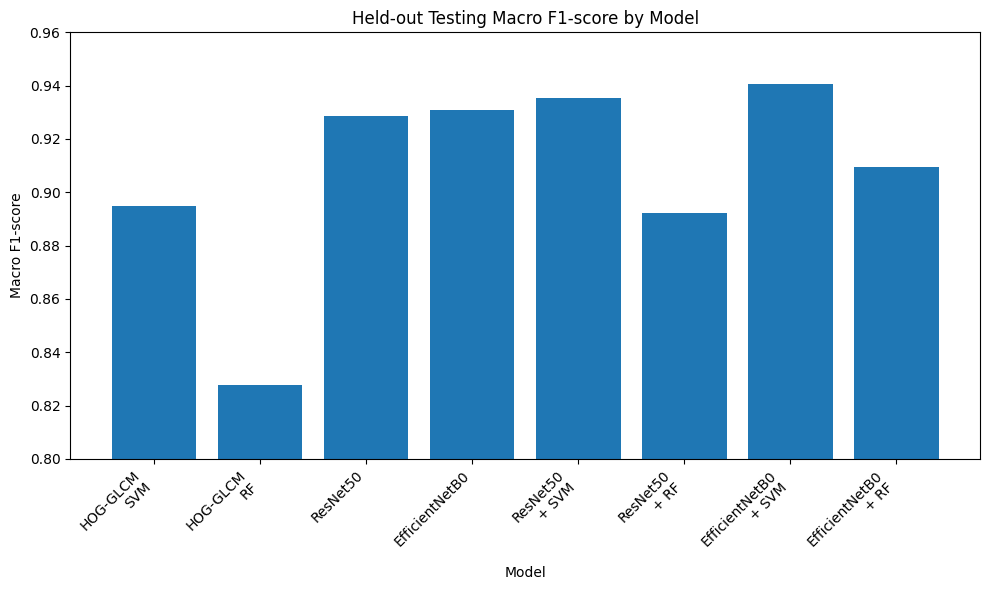

In [9]:
import matplotlib.pyplot as plt

models = [
    "HOG-GLCM\nSVM",
    "HOG-GLCM\nRF",
    "ResNet50",
    "EfficientNetB0",
    "ResNet50\n+ SVM",
    "ResNet50\n+ RF",
    "EfficientNetB0\n+ SVM",
    "EfficientNetB0\n+ RF"
]

macro_f1 = [
    0.8947,
    0.8279,
    0.9285,
    0.9308,
    0.9353,
    0.8922,
    0.9405,
    0.9095
]

fig, ax = plt.subplots(figsize=(10, 6))
ax.bar(models, macro_f1)

ax.set_title("Held-out Testing Macro F1-score by Model")
ax.set_xlabel("Model")
ax.set_ylabel("Macro F1-score")
ax.set_ylim(0.80, 0.96)

plt.xticks(rotation=45, ha="right")
plt.tight_layout()

plt.savefig("testing_macro_f1_all_models.png", dpi=300, bbox_inches="tight")
plt.show()

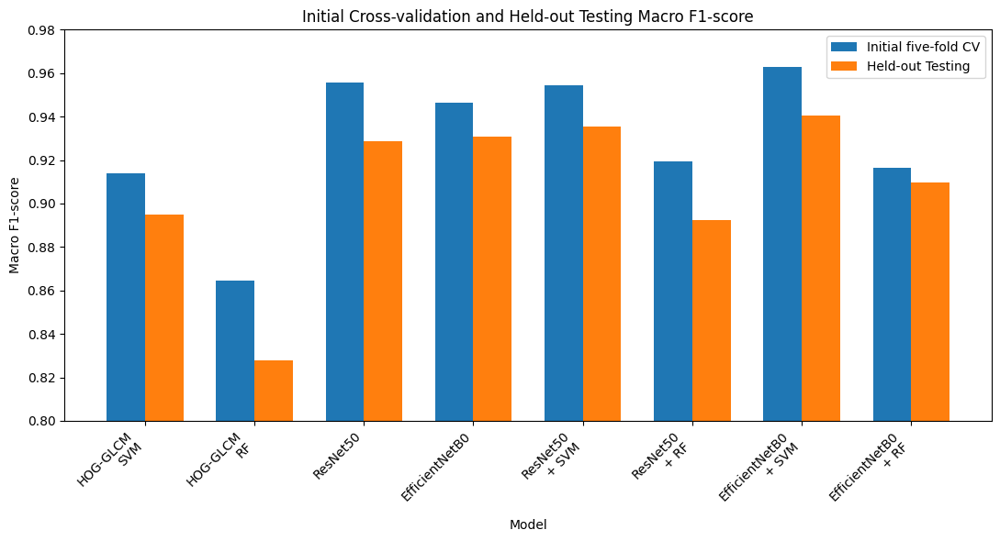

In [4]:
import numpy as np
import matplotlib.pyplot as plt

models = [
    "HOG-GLCM\nSVM",
    "HOG-GLCM\nRF",
    "ResNet50",
    "EfficientNetB0",
    "ResNet50\n+ SVM",
    "ResNet50\n+ RF",
    "EfficientNetB0\n+ SVM",
    "EfficientNetB0\n+ RF"
]

cv_f1 = [
    0.9137,
    0.8647,
    0.9556,
    0.9464,
    0.9545,
    0.9195,
    0.9628,
    0.9166
]

testing_f1 = [
    0.8947,
    0.8279,
    0.9285,
    0.9308,
    0.9353,
    0.8922,
    0.9405,
    0.9095
]

x = np.arange(len(models))
width = 0.35

fig, ax = plt.subplots(figsize=(11, 6))

ax.bar(x - width/2, cv_f1, width, label="Initial five-fold CV")
ax.bar(x + width/2, testing_f1, width, label="Held-out Testing")

ax.set_title("Initial Cross-validation and Held-out Testing Macro F1-score")
ax.set_xlabel("Model")
ax.set_ylabel("Macro F1-score")
ax.set_ylim(0.80, 0.98)

ax.set_xticks(x)
ax.set_xticklabels(models, rotation=45, ha="right")
ax.legend()

plt.tight_layout()

plt.savefig(
    "cv_vs_testing_macro_f1_all_models.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

# Held-Out Testing Misclassification Analysis

This section analyses the image-level predictions produced by all eight final models on the held-out Testing partition.

The aim is to identify which MRI images were misclassified by each model and determine whether some images were misclassified by several models or by all models. The prediction files will first be loaded and aligned using the image paths so that the same Testing image can be compared across all eight model configurations.

The analysis will then examine:

- the number of misclassified images for each model;
- images misclassified by multiple models;
- any images misclassified by all eight models;
- the true class and predicted class for each shared misclassification;
- the main confusion patterns between tumour classes;
- representative misclassified MRI images that can be included in the report.

The same prediction data will also be used to examine false positives and false negatives for each class, supporting a more detailed evaluation of model behaviour beyond macro F1-score.


In [1]:
# ============================================================
# HELD-OUT TESTING MISCLASSIFICATION ANALYSIS
# 1. File locations
# ============================================================

from pathlib import Path
import numpy as np
import pandas as pd


# Main local project folder
PROJECT_ROOT = Path(
    r"C:\Users\kwsta\OneDrive\Desktop\Desetation project\brain-tumour-mri-classification"
)


# ------------------------------------------------------------
# Classical models - already stored locally
# ------------------------------------------------------------

HOG_SVM_PREDICTIONS = (
    PROJECT_ROOT
    / "results"
    / "final_evaluation"
    / "svm_hog_glcm_cropped"
    / "testing_predictions.csv"
)

HOG_RF_PREDICTIONS = (
    PROJECT_ROOT
    / "results"
    / "final_evaluation"
    / "random_forest_hog_glcm_cropped"
    / "testing_predictions.csv"
)


# ------------------------------------------------------------
# Deep-learning and hybrid prediction files
# ------------------------------------------------------------

INPUT_DIRECTORY = Path(
    r"C:\Users\kwsta\OneDrive\Desktop\Desetation project\brain-tumour-mri-classification\missclassification_analysis_inputs"
)

RESNET50_PREDICTIONS = (
    INPUT_DIRECTORY / "resnet50_testing_predictions.csv"
)

EFFICIENTNETB0_PREDICTIONS = (
    INPUT_DIRECTORY / "efficientnetb0_testing_predictions.csv"
)

RESNET50_HYBRID_PREDICTIONS = (
    INPUT_DIRECTORY / "resnet50_hybrid_testing_predictions.npz"
)

EFFICIENTNETB0_HYBRID_PREDICTIONS = (
    INPUT_DIRECTORY / "efficientnetb0_hybrid_testing_predictions.npz"
)


# ------------------------------------------------------------
# Check that every required file can be found
# ------------------------------------------------------------

required_files = {
    "HOG-GLCM + SVM": HOG_SVM_PREDICTIONS,
    "HOG-GLCM + Random Forest": HOG_RF_PREDICTIONS,
    "ResNet50 end-to-end": RESNET50_PREDICTIONS,
    "EfficientNetB0 end-to-end": EFFICIENTNETB0_PREDICTIONS,
    "ResNet50 hybrid predictions": RESNET50_HYBRID_PREDICTIONS,
    "EfficientNetB0 hybrid predictions": EFFICIENTNETB0_HYBRID_PREDICTIONS,
}

print("Checking prediction files:\n")

all_files_found = True

for model_name, file_path in required_files.items():
    exists = file_path.exists()

    print(
        f"{model_name:<35} "
        f"{'FOUND' if exists else 'MISSING'}"
    )

    if not exists:
        print("   ", file_path)
        all_files_found = False


if not all_files_found:
    raise FileNotFoundError(
        "\nOne or more prediction files are missing. "
        "Check the paths shown above before continuing."
    )

print("\nAll prediction files were found successfully.")

Checking prediction files:

HOG-GLCM + SVM                      FOUND
HOG-GLCM + Random Forest            FOUND
ResNet50 end-to-end                 FOUND
EfficientNetB0 end-to-end           FOUND
ResNet50 hybrid predictions         FOUND
EfficientNetB0 hybrid predictions   FOUND

All prediction files were found successfully.


In [2]:
# ============================================================
# HELD-OUT TESTING MISCLASSIFICATION ANALYSIS
# 2. Load predictions from all eight models
# ============================================================


# ------------------------------------------------------------
# Load CSV prediction files
# ------------------------------------------------------------

hog_svm = pd.read_csv(HOG_SVM_PREDICTIONS)

hog_rf = pd.read_csv(HOG_RF_PREDICTIONS)

resnet50 = pd.read_csv(RESNET50_PREDICTIONS)

efficientnetb0 = pd.read_csv(EFFICIENTNETB0_PREDICTIONS)


# ------------------------------------------------------------
# Load hybrid NPZ prediction files
# ------------------------------------------------------------

resnet50_hybrid = np.load(
    RESNET50_HYBRID_PREDICTIONS,
    allow_pickle=True
)

efficientnetb0_hybrid = np.load(
    EFFICIENTNETB0_HYBRID_PREDICTIONS,
    allow_pickle=True
)


# ------------------------------------------------------------
# Class index mapping used by the hybrid prediction files
# ------------------------------------------------------------

CLASS_NAMES = np.array(
    ["glioma", "meningioma", "notumor", "pituitary"]
)


# ------------------------------------------------------------
# Extract ResNet50 hybrid predictions
# ------------------------------------------------------------

resnet50_hybrid_paths = resnet50_hybrid["relative_paths"]

resnet50_hybrid_true = CLASS_NAMES[
    resnet50_hybrid["true_class_indices"]
]

resnet50_svm_predictions = CLASS_NAMES[
    resnet50_hybrid["svm_predictions"]
]

resnet50_rf_predictions = CLASS_NAMES[
    resnet50_hybrid["rf_predictions"]
]


# ------------------------------------------------------------
# Extract EfficientNetB0 hybrid predictions
# ------------------------------------------------------------

efficientnetb0_hybrid_paths = efficientnetb0_hybrid["relative_paths"]

efficientnetb0_hybrid_true = CLASS_NAMES[
    efficientnetb0_hybrid["true_class_indices"]
]

efficientnetb0_svm_predictions = CLASS_NAMES[
    efficientnetb0_hybrid["svm_predictions"]
]

efficientnetb0_rf_predictions = CLASS_NAMES[
    efficientnetb0_hybrid["rf_predictions"]
]


# ------------------------------------------------------------
# Basic checks
# ------------------------------------------------------------

print("Prediction counts:\n")

print("HOG-GLCM + SVM:                 ", len(hog_svm))
print("HOG-GLCM + Random Forest:       ", len(hog_rf))
print("ResNet50 end-to-end:            ", len(resnet50))
print("EfficientNetB0 end-to-end:      ", len(efficientnetb0))
print("ResNet50 features + SVM:        ", len(resnet50_svm_predictions))
print("ResNet50 features + RF:         ", len(resnet50_rf_predictions))
print("EfficientNetB0 features + SVM:  ", len(efficientnetb0_svm_predictions))
print("EfficientNetB0 features + RF:   ", len(efficientnetb0_rf_predictions))


expected_count = 1598

counts = [
    len(hog_svm),
    len(hog_rf),
    len(resnet50),
    len(efficientnetb0),
    len(resnet50_svm_predictions),
    len(resnet50_rf_predictions),
    len(efficientnetb0_svm_predictions),
    len(efficientnetb0_rf_predictions),
]

if not all(count == expected_count for count in counts):
    raise ValueError(
        "At least one model does not contain exactly 1,598 Testing predictions."
    )


print("\nAll eight models contain 1,598 Testing predictions.")

Prediction counts:

HOG-GLCM + SVM:                  1598
HOG-GLCM + Random Forest:        1598
ResNet50 end-to-end:             1598
EfficientNetB0 end-to-end:       1598
ResNet50 features + SVM:         1598
ResNet50 features + RF:          1598
EfficientNetB0 features + SVM:   1598
EfficientNetB0 features + RF:    1598

All eight models contain 1,598 Testing predictions.


In [3]:
# ============================================================
# HELD-OUT TESTING MISCLASSIFICATION ANALYSIS
# 3. Verify image-path and true-label alignment
# ============================================================


# ------------------------------------------------------------
# Function to standardise relative image paths
# ------------------------------------------------------------

def normalise_path(path):
    return str(path).replace("\\", "/").lstrip("./")


# ------------------------------------------------------------
# Create path and true-label tables for each prediction source
# ------------------------------------------------------------

alignment_tables = {
    "HOG-GLCM + SVM": pd.DataFrame({
        "relative_path": hog_svm["relative_path"].map(normalise_path),
        "true_class": hog_svm["true_class"]
    }),

    "HOG-GLCM + Random Forest": pd.DataFrame({
        "relative_path": hog_rf["relative_path"].map(normalise_path),
        "true_class": hog_rf["true_class"]
    }),

    "ResNet50 end-to-end": pd.DataFrame({
        "relative_path": resnet50["relative_path"].map(normalise_path),
        "true_class": resnet50["true_class"]
    }),

    "EfficientNetB0 end-to-end": pd.DataFrame({
        "relative_path": efficientnetb0["relative_path"].map(normalise_path),
        "true_class": efficientnetb0["true_class"]
    }),

    "ResNet50 hybrid": pd.DataFrame({
        "relative_path": [
            normalise_path(path)
            for path in resnet50_hybrid_paths
        ],
        "true_class": resnet50_hybrid_true
    }),

    "EfficientNetB0 hybrid": pd.DataFrame({
        "relative_path": [
            normalise_path(path)
            for path in efficientnetb0_hybrid_paths
        ],
        "true_class": efficientnetb0_hybrid_true
    }),
}


# ------------------------------------------------------------
# Check for duplicate image paths
# ------------------------------------------------------------

print("Checking image-path uniqueness:\n")

for source_name, table in alignment_tables.items():

    number_unique = table["relative_path"].nunique()
    number_rows = len(table)

    print(
        f"{source_name:<35} "
        f"{number_unique} unique paths"
    )

    if number_unique != number_rows:
        raise ValueError(
            f"Duplicate image paths were found in {source_name}."
        )


# ------------------------------------------------------------
# Use HOG-GLCM + SVM as the reference image set
# ------------------------------------------------------------

reference_table = alignment_tables["HOG-GLCM + SVM"]

reference_paths = set(reference_table["relative_path"])


# ------------------------------------------------------------
# Check that every source contains exactly the same images
# ------------------------------------------------------------

print("\nChecking that all sources contain the same Testing images:\n")

for source_name, table in alignment_tables.items():

    current_paths = set(table["relative_path"])

    missing_paths = reference_paths - current_paths
    extra_paths = current_paths - reference_paths

    if missing_paths or extra_paths:

        print(f"{source_name}: FAILED")
        print("Missing paths:", len(missing_paths))
        print("Extra paths:", len(extra_paths))

        raise ValueError(
            f"Image paths do not match for {source_name}."
        )

    print(f"{source_name:<35} MATCH")


# ------------------------------------------------------------
# Check that the true class agrees for every image
# ------------------------------------------------------------

reference_labels = dict(
    zip(
        reference_table["relative_path"],
        reference_table["true_class"]
    )
)

print("\nChecking true-class labels:\n")

for source_name, table in alignment_tables.items():

    current_labels = dict(
        zip(
            table["relative_path"],
            table["true_class"]
        )
    )

    disagreements = [
        path
        for path in reference_paths
        if current_labels[path] != reference_labels[path]
    ]

    if disagreements:

        print(f"{source_name}: FAILED")
        print("Label disagreements:", len(disagreements))

        raise ValueError(
            f"True-class labels do not agree for {source_name}."
        )

    print(f"{source_name:<35} MATCH")


print(
    "\nAll prediction sources contain the same 1,598 Testing images "
    "with matching true-class labels."
)

Checking image-path uniqueness:

HOG-GLCM + SVM                      1598 unique paths
HOG-GLCM + Random Forest            1598 unique paths
ResNet50 end-to-end                 1598 unique paths
EfficientNetB0 end-to-end           1598 unique paths
ResNet50 hybrid                     1598 unique paths
EfficientNetB0 hybrid               1598 unique paths

Checking that all sources contain the same Testing images:

HOG-GLCM + SVM                      MATCH
HOG-GLCM + Random Forest            MATCH
ResNet50 end-to-end                 MATCH
EfficientNetB0 end-to-end           MATCH
ResNet50 hybrid                     MATCH
EfficientNetB0 hybrid               MATCH

Checking true-class labels:

HOG-GLCM + SVM                      MATCH
HOG-GLCM + Random Forest            MATCH
ResNet50 end-to-end                 MATCH
EfficientNetB0 end-to-end           MATCH
ResNet50 hybrid                     MATCH
EfficientNetB0 hybrid               MATCH

All prediction sources contain the same 1,598 T

In [4]:
# ============================================================
# HELD-OUT TESTING MISCLASSIFICATION ANALYSIS
# 4. Combine predictions from all eight models
# ============================================================


# ------------------------------------------------------------
# Start with the verified reference image list
# ------------------------------------------------------------

combined_predictions = reference_table.copy()

combined_predictions = combined_predictions.sort_values(
    "relative_path"
).reset_index(drop=True)


# ------------------------------------------------------------
# Create path-to-prediction mappings for each model
# ------------------------------------------------------------

prediction_mappings = {

    "hog_svm": dict(zip(
        hog_svm["relative_path"].map(normalise_path),
        hog_svm["predicted_class"]
    )),

    "hog_rf": dict(zip(
        hog_rf["relative_path"].map(normalise_path),
        hog_rf["predicted_class"]
    )),

    "resnet50_e2e": dict(zip(
        resnet50["relative_path"].map(normalise_path),
        resnet50["predicted_class"]
    )),

    "efficientnetb0_e2e": dict(zip(
        efficientnetb0["relative_path"].map(normalise_path),
        efficientnetb0["predicted_class"]
    )),

    "resnet50_svm": dict(zip(
        [normalise_path(path) for path in resnet50_hybrid_paths],
        resnet50_svm_predictions
    )),

    "resnet50_rf": dict(zip(
        [normalise_path(path) for path in resnet50_hybrid_paths],
        resnet50_rf_predictions
    )),

    "efficientnetb0_svm": dict(zip(
        [normalise_path(path) for path in efficientnetb0_hybrid_paths],
        efficientnetb0_svm_predictions
    )),

    "efficientnetb0_rf": dict(zip(
        [normalise_path(path) for path in efficientnetb0_hybrid_paths],
        efficientnetb0_rf_predictions
    )),
}


# ------------------------------------------------------------
# Add each model's prediction to the combined table
# ------------------------------------------------------------

for model_name, prediction_mapping in prediction_mappings.items():

    combined_predictions[model_name] = (
        combined_predictions["relative_path"]
        .map(prediction_mapping)
    )


# ------------------------------------------------------------
# Confirm that no predictions are missing after alignment
# ------------------------------------------------------------

model_columns = list(prediction_mappings.keys())

missing_predictions = (
    combined_predictions[model_columns]
    .isna()
    .sum()
)

if missing_predictions.sum() != 0:

    print("Missing predictions:")
    print(missing_predictions[missing_predictions > 0])

    raise ValueError(
        "At least one prediction is missing from the combined table."
    )


# ------------------------------------------------------------
# Record whether each model misclassified each image
# ------------------------------------------------------------

error_columns = []

for model_name in model_columns:

    error_column = f"{model_name}_error"

    combined_predictions[error_column] = (
        combined_predictions[model_name]
        != combined_predictions["true_class"]
    )

    error_columns.append(error_column)


# ------------------------------------------------------------
# Count how many of the eight models misclassified each image
# ------------------------------------------------------------

combined_predictions["number_models_misclassified"] = (
    combined_predictions[error_columns]
    .sum(axis=1)
)


combined_predictions["all_models_misclassified"] = (
    combined_predictions["number_models_misclassified"] == 8
)


# ------------------------------------------------------------
# Final checks
# ------------------------------------------------------------

print("Combined prediction table created successfully.\n")

print("Rows:", len(combined_predictions))
print("Models:", len(model_columns))

print(
    "Images with complete predictions:",
    combined_predictions[model_columns]
    .notna()
    .all(axis=1)
    .sum()
)

print("\nFirst five rows:")

display(
    combined_predictions[
        [
            "relative_path",
            "true_class",
            *model_columns,
            "number_models_misclassified"
        ]
    ].head()
)

Combined prediction table created successfully.

Rows: 1598
Models: 8
Images with complete predictions: 1598

First five rows:


,relative_path,true_class,hog_svm,hog_rf,resnet50_e2e,efficientnetb0_e2e,resnet50_svm,resnet50_rf,efficientnetb0_svm,efficientnetb0_rf,number_models_misclassified
0,Testing/glioma/Te-gl_1.png,glioma,meningioma,notumor,notumor,pituitary,meningioma,notumor,meningioma,glioma,7
1,Testing/glioma/Te-gl_10.png,glioma,glioma,glioma,glioma,glioma,glioma,glioma,glioma,glioma,0
2,Testing/glioma/Te-gl_100.png,glioma,glioma,glioma,glioma,glioma,glioma,glioma,glioma,glioma,0
3,Testing/glioma/Te-gl_101.png,glioma,glioma,meningioma,glioma,glioma,glioma,meningioma,glioma,meningioma,3
4,Testing/glioma/Te-gl_102.png,glioma,glioma,glioma,glioma,meningioma,glioma,notumor,meningioma,notumor,4


In [5]:
# ============================================================
# HELD-OUT TESTING MISCLASSIFICATION ANALYSIS
# 5. Count model errors and shared misclassifications
# ============================================================


# Friendly names for reporting
MODEL_DISPLAY_NAMES = {
    "hog_svm": "HOG-GLCM + SVM",
    "hog_rf": "HOG-GLCM + Random Forest",
    "resnet50_e2e": "ResNet50 end-to-end",
    "efficientnetb0_e2e": "EfficientNetB0 end-to-end",
    "resnet50_svm": "ResNet50 features + SVM",
    "resnet50_rf": "ResNet50 features + Random Forest",
    "efficientnetb0_svm": "EfficientNetB0 features + SVM",
    "efficientnetb0_rf": "EfficientNetB0 features + Random Forest",
}


# ------------------------------------------------------------
# Number of misclassified images for each model
# ------------------------------------------------------------

model_error_counts = []

for model_name in model_columns:

    error_count = int(
        (
            combined_predictions[model_name]
            != combined_predictions["true_class"]
        ).sum()
    )

    correct_count = len(combined_predictions) - error_count

    accuracy = correct_count / len(combined_predictions)

    model_error_counts.append({
        "model": MODEL_DISPLAY_NAMES[model_name],
        "correct": correct_count,
        "misclassified": error_count,
        "accuracy": accuracy
    })


model_error_summary = pd.DataFrame(model_error_counts)

print("Misclassification counts by model:\n")

display(
    model_error_summary.sort_values(
        "misclassified"
    ).reset_index(drop=True)
)


# ------------------------------------------------------------
# Count images by the number of models that misclassified them
# ------------------------------------------------------------

overlap_summary = (
    combined_predictions["number_models_misclassified"]
    .value_counts()
    .sort_index()
    .reindex(range(9), fill_value=0)
    .rename_axis("number_of_models")
    .reset_index(name="number_of_images")
)


print("\nNumber of Testing images misclassified by 0 to 8 models:\n")

display(overlap_summary)


# ------------------------------------------------------------
# Important shared-error counts
# ------------------------------------------------------------

misclassified_by_at_least_two = int(
    (
        combined_predictions["number_models_misclassified"] >= 2
    ).sum()
)

misclassified_by_at_least_four = int(
    (
        combined_predictions["number_models_misclassified"] >= 4
    ).sum()
)

misclassified_by_at_least_six = int(
    (
        combined_predictions["number_models_misclassified"] >= 6
    ).sum()
)

misclassified_by_all_eight = int(
    (
        combined_predictions["number_models_misclassified"] == 8
    ).sum()
)


print("\nShared misclassification summary:\n")

print(
    "Misclassified by at least 2 models:",
    misclassified_by_at_least_two
)

print(
    "Misclassified by at least 4 models:",
    misclassified_by_at_least_four
)

print(
    "Misclassified by at least 6 models:",
    misclassified_by_at_least_six
)

print(
    "Misclassified by all 8 models:",
    misclassified_by_all_eight
)

Misclassification counts by model:



,model,correct,misclassified,accuracy
0,EfficientNetB0 features + SVM,1505,93,0.941802
1,ResNet50 features + SVM,1497,101,0.936796
2,EfficientNetB0 end-to-end,1490,108,0.932416
3,ResNet50 end-to-end,1485,113,0.929287
4,EfficientNetB0 features + Random Forest,1456,142,0.911139
5,HOG-GLCM + SVM,1434,164,0.897372
6,ResNet50 features + Random Forest,1431,167,0.895494
7,HOG-GLCM + Random Forest,1332,266,0.833542



Number of Testing images misclassified by 0 to 8 models:



,number_of_models,number_of_images
0,0,1259
1,1,103
2,2,73
3,3,38
4,4,26
5,5,20
6,6,13
7,7,19
8,8,47



Shared misclassification summary:

Misclassified by at least 2 models: 236
Misclassified by at least 4 models: 125
Misclassified by at least 6 models: 79
Misclassified by all 8 models: 47


In [6]:
# ============================================================
# HELD-OUT TESTING MISCLASSIFICATION ANALYSIS
# 6. Examine images misclassified by all eight models
# ============================================================


# ------------------------------------------------------------
# Select images misclassified by every model
# ------------------------------------------------------------

all_eight_errors = combined_predictions[
    combined_predictions["number_models_misclassified"] == 8
].copy()


print(
    "Images misclassified by all eight models:",
    len(all_eight_errors)
)


# ------------------------------------------------------------
# Count their true classes
# ------------------------------------------------------------

common_error_class_counts = (
    all_eight_errors["true_class"]
    .value_counts()
    .rename_axis("true_class")
    .reset_index(name="number_of_images")
)


print("\nTrue classes of the 47 common misclassifications:\n")

display(common_error_class_counts)


# ------------------------------------------------------------
# Determine whether all eight models made the same wrong prediction
# ------------------------------------------------------------

all_eight_errors["number_of_different_predictions"] = (
    all_eight_errors[model_columns]
    .nunique(axis=1)
)

all_eight_errors["same_wrong_prediction_by_all_models"] = (
    all_eight_errors["number_of_different_predictions"] == 1
)


same_wrong_count = int(
    all_eight_errors["same_wrong_prediction_by_all_models"].sum()
)

different_wrong_count = (
    len(all_eight_errors) - same_wrong_count
)


print("Common-error agreement:\n")

print(
    "All eight models made the same wrong prediction:",
    same_wrong_count
)

print(
    "All eight models were wrong but predicted different classes:",
    different_wrong_count
)


# ------------------------------------------------------------
# Show all 47 common misclassified images
# ------------------------------------------------------------

columns_to_show = [
    "relative_path",
    "true_class",
    *model_columns,
    "number_of_different_predictions"
]


print("\nImages misclassified by all eight models:\n")

display(
    all_eight_errors[
        columns_to_show
    ].reset_index(drop=True)
)

Images misclassified by all eight models: 47

True classes of the 47 common misclassifications:



,true_class,number_of_images
0,glioma,46
1,meningioma,1


Common-error agreement:

All eight models made the same wrong prediction: 21
All eight models were wrong but predicted different classes: 26

Images misclassified by all eight models:



,relative_path,true_class,hog_svm,hog_rf,resnet50_e2e,efficientnetb0_e2e,resnet50_svm,resnet50_rf,efficientnetb0_svm,efficientnetb0_rf,number_of_different_predictions
0,Testing/glioma/Te-gl_106.png,glioma,notumor,notumor,meningioma,meningioma,meningioma,notumor,meningioma,meningioma,2
1,Testing/glioma/Te-gl_109.png,glioma,notumor,notumor,meningioma,meningioma,notumor,notumor,meningioma,meningioma,2
2,Testing/glioma/Te-gl_115.png,glioma,meningioma,meningioma,meningioma,meningioma,meningioma,meningioma,meningioma,meningioma,1
3,Testing/glioma/Te-gl_129.png,glioma,meningioma,notumor,meningioma,meningioma,meningioma,notumor,meningioma,meningioma,2
4,Testing/glioma/Te-gl_144.png,glioma,notumor,notumor,meningioma,meningioma,meningioma,meningioma,meningioma,notumor,2
5,Testing/glioma/Te-gl_151.png,glioma,meningioma,notumor,meningioma,meningioma,meningioma,notumor,meningioma,notumor,2
6,Testing/glioma/Te-gl_159.png,glioma,pituitary,notumor,notumor,pituitary,notumor,meningioma,pituitary,pituitary,3
7,Testing/glioma/Te-gl_160.png,glioma,meningioma,pituitary,pituitary,meningioma,meningioma,pituitary,meningioma,pituitary,2
8,Testing/glioma/Te-gl_171.png,glioma,notumor,notumor,meningioma,meningioma,meningioma,meningioma,meningioma,meningioma,2
9,Testing/glioma/Te-gl_187.png,glioma,notumor,notumor,meningioma,meningioma,notumor,notumor,meningioma,meningioma,2


In [7]:
# ============================================================
# HELD-OUT TESTING MISCLASSIFICATION ANALYSIS
# 7. Summarise the common-error patterns
# ============================================================


# ------------------------------------------------------------
# True classes among images misclassified by all eight models
# ------------------------------------------------------------

common_error_true_classes = (
    all_eight_errors["true_class"]
    .value_counts()
    .reindex(CLASS_NAMES, fill_value=0)
    .rename_axis("true_class")
    .reset_index(name="number_of_images")
)

print("True classes among images misclassified by all eight models:\n")
display(common_error_true_classes)


# ------------------------------------------------------------
# Images where all eight models made exactly the same mistake
# ------------------------------------------------------------

unanimous_wrong = all_eight_errors[
    all_eight_errors["same_wrong_prediction_by_all_models"]
].copy()


# Because every model gave the same prediction

True classes among images misclassified by all eight models:



,true_class,number_of_images
0,glioma,46
1,meningioma,1
2,notumor,0
3,pituitary,0


Images misclassified by all eight models: 47
Glioma images: 46
Meningioma images: 1


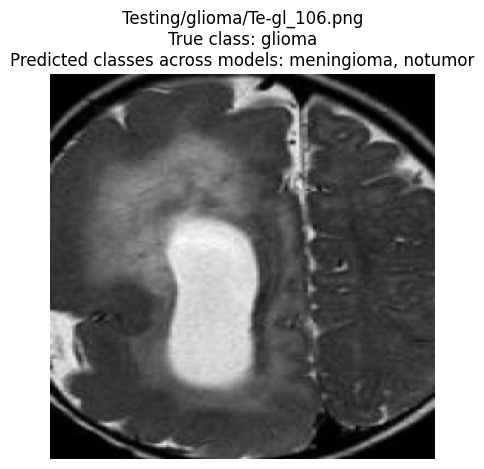

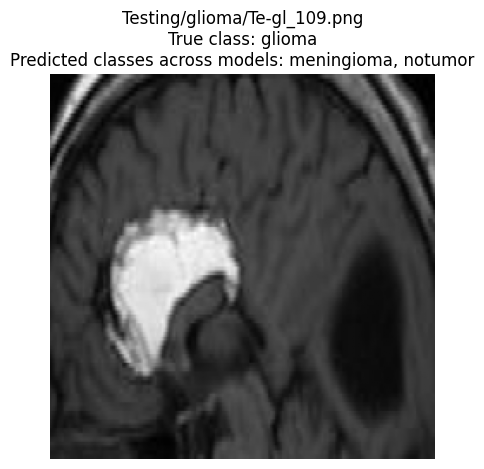

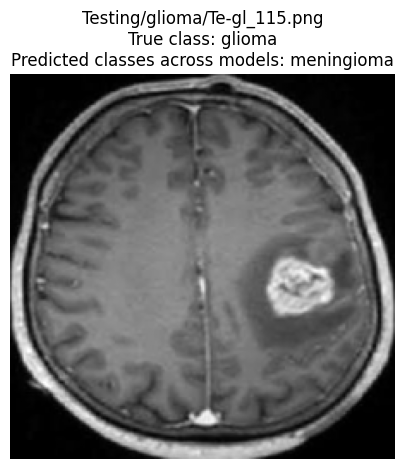

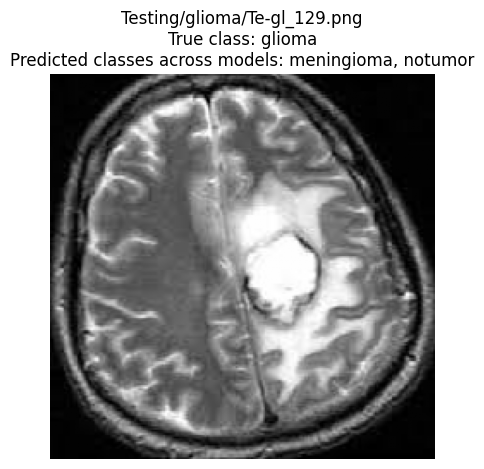

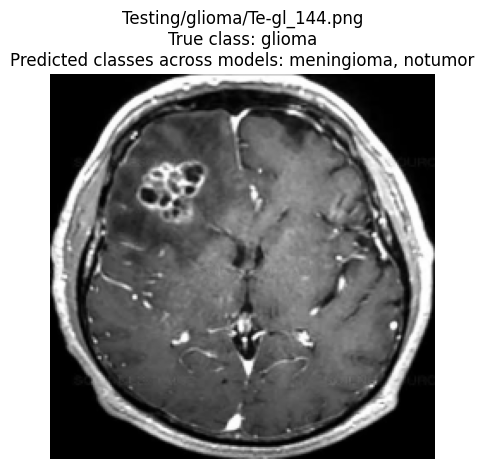

...

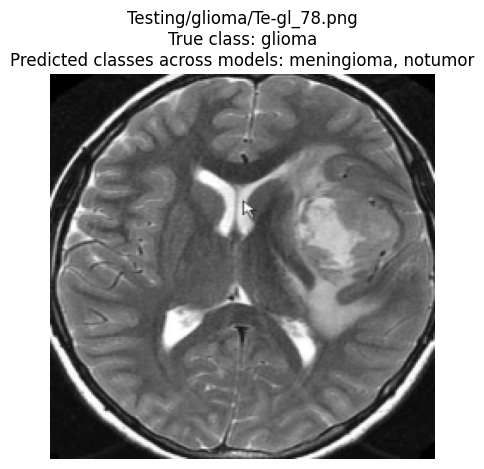

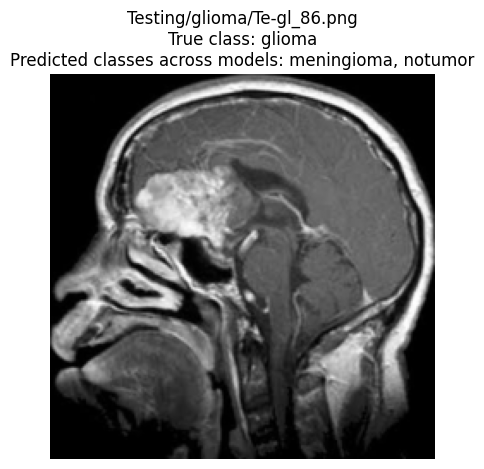

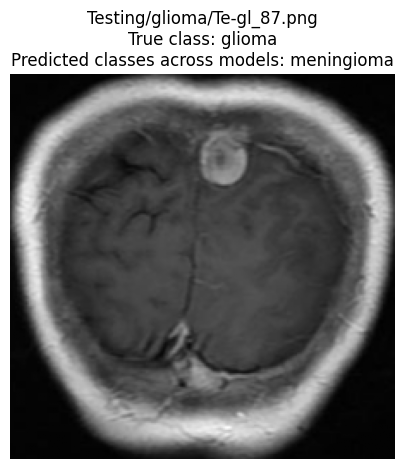

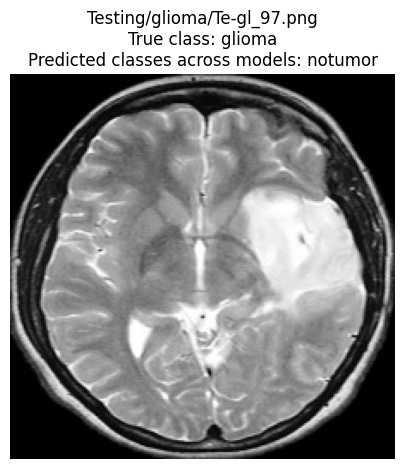

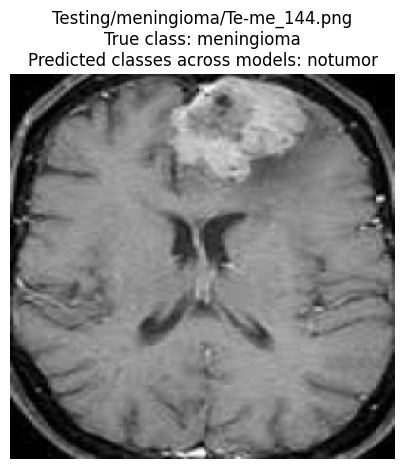

In [8]:
# ============================================================
# HELD-OUT TESTING MISCLASSIFICATION ANALYSIS
# 8. Display all images misclassified by all eight models
# ============================================================

import matplotlib.pyplot as plt
from PIL import Image


# Processed Testing images are stored here
IMAGE_ROOT = PROJECT_ROOT / "processed_data_cropped"


# ------------------------------------------------------------
# Select all 47 images misclassified by every model
# ------------------------------------------------------------

all_common_errors = combined_predictions[
    combined_predictions["number_models_misclassified"] == 8
].copy()


# Sort by true class and image path
all_common_errors = all_common_errors.sort_values(
    ["true_class", "relative_path"]
).reset_index(drop=True)


print(
    "Images misclassified by all eight models:",
    len(all_common_errors)
)

print(
    "Glioma images:",
    (all_common_errors["true_class"] == "glioma").sum()
)

print(
    "Meningioma images:",
    (all_common_errors["true_class"] == "meningioma").sum()
)


# ------------------------------------------------------------
# Display every common misclassified image
# ------------------------------------------------------------

for _, row in all_common_errors.iterrows():

    relative_path = row["relative_path"]

    image_path = IMAGE_ROOT / relative_path

    if not image_path.exists():
        raise FileNotFoundError(
            f"Image not found: {image_path}"
        )

    image = Image.open(image_path)

    plt.figure(figsize=(5, 5))

    plt.imshow(image, cmap="gray")

    plt.axis("off")

    prediction_summary = ", ".join(
        sorted(set(row[model_columns]))
    )

    plt.title(
        f"{relative_path}\n"
        f"True class: {row['true_class']}\n"
        f"Predicted classes across models: {prediction_summary}"
    )

    plt.show()

Training glioma images found: 1400

Lowest visible-content percentages:



,image_name,image_path,content_percentage
0,Tr-gl_628.png,C:\Users\kwsta\OneDrive\Desktop\Desetation pro...,65.051020
1,Tr-gl_1296.png,C:\Users\kwsta\OneDrive\Desktop\Desetation pro...,65.439652
2,Tr-gl_566.png,C:\Users\kwsta\OneDrive\Desktop\Desetation pro...,65.485491
3,Tr-gl_472.png,C:\Users\kwsta\OneDrive\Desktop\Desetation pro...,65.648916
4,Tr-gl_582.png,C:\Users\kwsta\OneDrive\Desktop\Desetation pro...,66.089365
5,Tr-gl_662.png,C:\Users\kwsta\OneDrive\Desktop\Desetation pro...,66.693240
6,Tr-gl_1398.png,C:\Users\kwsta\OneDrive\Desktop\Desetation pro...,66.786910
7,Tr-gl_789.png,C:\Users\kwsta\OneDrive\Desktop\Desetation pro...,67.173549
8,Tr-gl_528.png,C:\Users\kwsta\OneDrive\Desktop\Desetation pro...,67.586097
9,Tr-gl_1304.png,C:\Users\kwsta\OneDrive\Desktop\Desetation pro...,68.034518



Summary:

count    1400.000000
mean       99.443509
std         3.512613
min        65.051020
25%        99.911810
50%        99.977081
75%        99.996014
max       100.000000
Name: content_percentage, dtype: float64


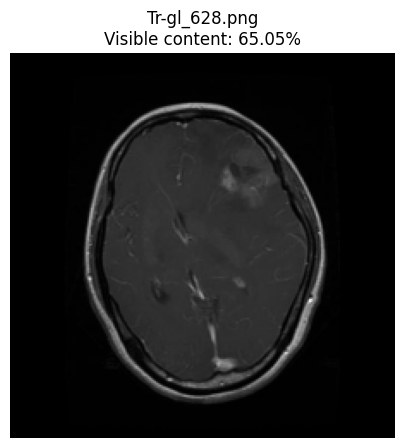

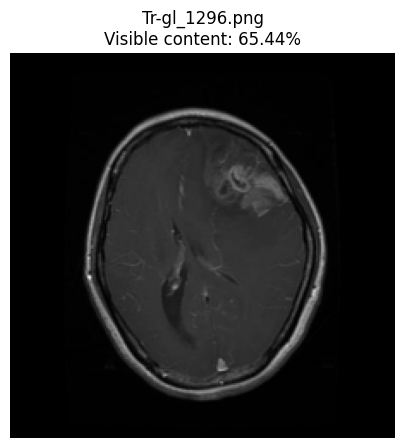

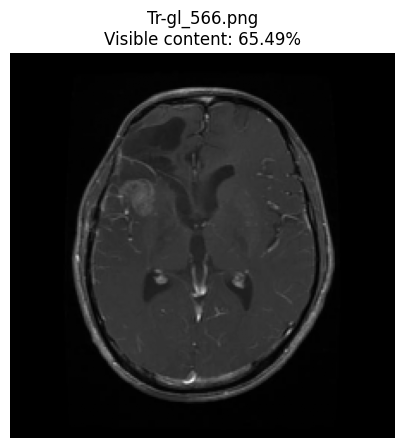

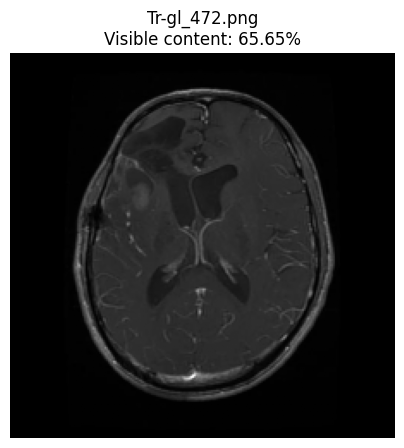

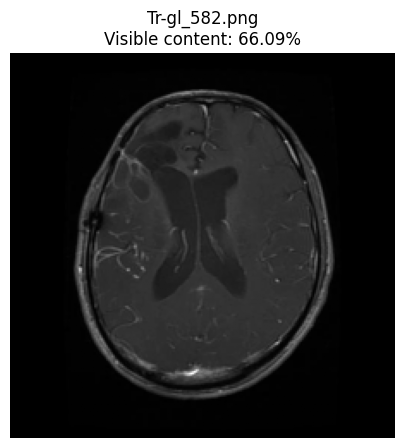

...

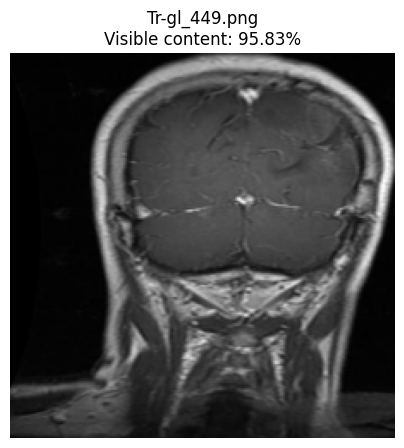

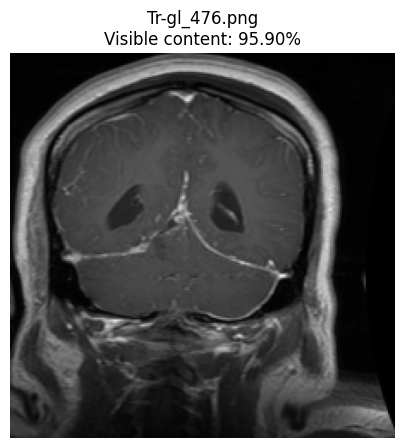

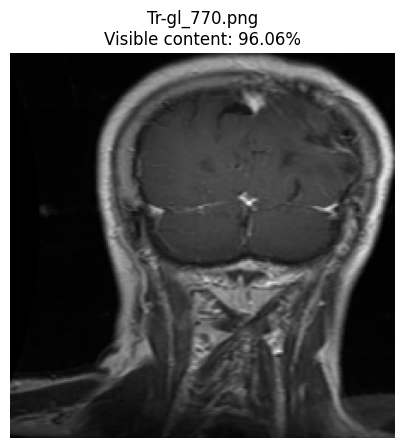

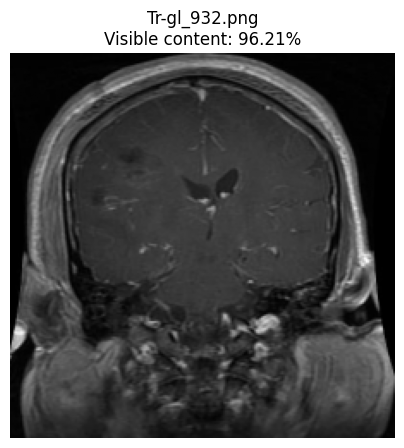

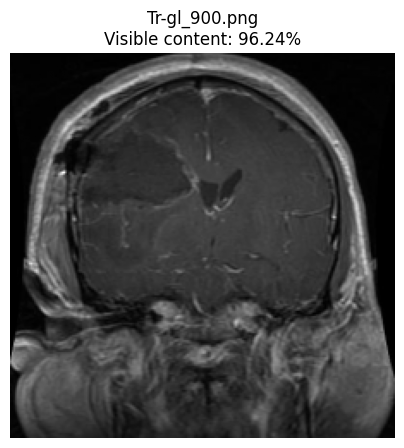

In [9]:
# ============================================================
# HELD-OUT TESTING MISCLASSIFICATION ANALYSIS
# 9. Inspect processed Training glioma images
# ============================================================

import cv2
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path


# ------------------------------------------------------------
# Processed Training glioma directory
# ------------------------------------------------------------

TRAINING_GLIOMA_DIRECTORY = Path(
    r"C:\Users\kwsta\OneDrive\Desktop\Desetation project\brain-tumour-mri-classification\processed_data_cropped\Training\glioma"
)


# ------------------------------------------------------------
# Check the directory
# ------------------------------------------------------------

if not TRAINING_GLIOMA_DIRECTORY.exists():
    raise FileNotFoundError(
        f"Training glioma directory not found:\n"
        f"{TRAINING_GLIOMA_DIRECTORY}"
    )


glioma_paths = sorted(
    TRAINING_GLIOMA_DIRECTORY.glob("*.png")
)


print("Training glioma images found:", len(glioma_paths))


if len(glioma_paths) != 1400:
    raise ValueError(
        f"Expected 1,400 Training glioma images, "
        f"but found {len(glioma_paths)}."
    )


# ------------------------------------------------------------
# Measure how much of each final 224 x 224 image contains
# non-black image content
# ------------------------------------------------------------

results = []

for image_path in glioma_paths:

    image = cv2.imread(
        str(image_path),
        cv2.IMREAD_GRAYSCALE
    )

    if image is None:
        raise RuntimeError(
            f"Could not read image: {image_path}"
        )

    # Pixels above zero are treated as visible image content
    non_black_mask = image > 0

    non_black_pixels = int(non_black_mask.sum())
    total_pixels = int(image.size)

    content_percentage = (
        non_black_pixels / total_pixels
    ) * 100

    results.append({
        "image_name": image_path.name,
        "image_path": str(image_path),
        "content_percentage": content_percentage
    })


glioma_content = pd.DataFrame(results)


# ------------------------------------------------------------
# Sort from lowest visible-content percentage
# ------------------------------------------------------------

glioma_content = glioma_content.sort_values(
    "content_percentage",
    ascending=True
).reset_index(drop=True)


print("\nLowest visible-content percentages:\n")

display(
    glioma_content.head(30)
)


print("\nSummary:\n")

print(
    glioma_content["content_percentage"]
    .describe()
)


# ------------------------------------------------------------
# Display the 30 images with the lowest content percentages
# ------------------------------------------------------------

lowest_images = glioma_content.head(30)


for _, row in lowest_images.iterrows():

    image = cv2.imread(
        row["image_path"],
        cv2.IMREAD_GRAYSCALE
    )

    plt.figure(figsize=(5, 5))

    plt.imshow(
        image,
        cmap="gray"
    )

    plt.axis("off")

    plt.title(
        f"{row['image_name']}\n"
        f"Visible content: "
        f"{row['content_percentage']:.2f}%"
    )

    plt.show()

## False Positive and False Negative Analysis

To examine model behaviour in more detail, false-positive and false-negative counts were calculated for each of the four classes across all eight final models using the held-out Testing partition.

Because this is a multi-class classification problem, the counts were calculated separately for each class using a one-versus-rest interpretation.

For a given class:

- a true positive (TP) is an image correctly predicted as that class;
- a false positive (FP) is an image from another class incorrectly predicted as that class;
- a false negative (FN) is an image from that class incorrectly predicted as another class;
- a true negative (TN) is an image from another class correctly predicted as not belonging to that class.

This analysis is useful because accuracy and macro F1-score summarise overall performance, while false-positive and false-negative counts show the specific types of errors made by each model. This is particularly relevant for the glioma and no-tumour classes, where some errors may represent tumour images being classified as another tumour type or as no tumour.

In [10]:
# ============================================================
# HELD-OUT TESTING MISCLASSIFICATION ANALYSIS
# 10. False positives and false negatives by class
# ============================================================

from sklearn.metrics import confusion_matrix


class_names = [
    "glioma",
    "meningioma",
    "notumor",
    "pituitary"
]


fp_fn_results = []


# ------------------------------------------------------------
# Calculate TP, FP, FN and TN for each class and model
# ------------------------------------------------------------

for model_name in model_columns:

    y_true = combined_predictions["true_class"]
    y_pred = combined_predictions[model_name]

    cm = confusion_matrix(
        y_true,
        y_pred,
        labels=class_names
    )

    total_images = cm.sum()

    for class_index, class_name in enumerate(class_names):

        true_positive = int(
            cm[class_index, class_index]
        )

        false_negative = int(
            cm[class_index, :].sum()
            - true_positive
        )

        false_positive = int(
            cm[:, class_index].sum()
            - true_positive
        )

        true_negative = int(
            total_images
            - true_positive
            - false_negative
            - false_positive
        )

        fp_fn_results.append({
            "model": MODEL_DISPLAY_NAMES[model_name],
            "class": class_name,
            "TP": true_positive,
            "FP": false_positive,
            "FN": false_negative,
            "TN": true_negative
        })


fp_fn_table = pd.DataFrame(fp_fn_results)


# ------------------------------------------------------------
# Display complete results
# ------------------------------------------------------------

print(
    "False-positive and false-negative counts "
    "for the held-out Testing partition:\n"
)

display(fp_fn_table)


# ------------------------------------------------------------
# Separate view of false negatives
# ------------------------------------------------------------

false_negative_table = (
    fp_fn_table[
        ["model", "class", "FN"]
    ]
    .pivot(
        index="model",
        columns="class",
        values="FN"
    )
)


print("\nFalse negatives by model and class:\n")

display(false_negative_table)


# ------------------------------------------------------------
# Separate view of false positives
# ------------------------------------------------------------

false_positive_table = (
    fp_fn_table[
        ["model", "class", "FP"]
    ]
    .pivot(
        index="model",
        columns="class",
        values="FP"
    )
)


print("\nFalse positives by model and class:\n")

display(false_positive_table)

False-positive and false-negative counts for the held-out Testing partition:



,model,class,TP,FP,FN,TN
0,HOG-GLCM + SVM,glioma,289,24,111,1174
1,HOG-GLCM + SVM,meningioma,360,80,40,1118
2,HOG-GLCM + SVM,notumor,398,36,0,1164
3,HOG-GLCM + SVM,pituitary,387,24,13,1174
4,HOG-GLCM + Random Forest,glioma,247,58,153,1140
5,HOG-GLCM + Random Forest,meningioma,326,92,74,1106
6,HOG-GLCM + Random Forest,notumor,397,58,1,1142
7,HOG-GLCM + Random Forest,pituitary,362,58,38,1140
8,ResNet50 end-to-end,glioma,319,16,81,1182
9,ResNet50 end-to-end,meningioma,385,72,15,1126



False negatives by model and class:



class,glioma,meningioma,notumor,pituitary
model,,,,
EfficientNetB0 end-to-end,92,10,0,6
EfficientNetB0 features + Random Forest,102,27,0,13
EfficientNetB0 features + SVM,83,6,0,4
HOG-GLCM + Random Forest,153,74,1,38
HOG-GLCM + SVM,111,40,0,13
ResNet50 end-to-end,81,15,0,17
ResNet50 features + Random Forest,127,27,0,13
ResNet50 features + SVM,86,11,0,4



False positives by model and class:



class,glioma,meningioma,notumor,pituitary
model,,,,
EfficientNetB0 end-to-end,9,72,19,8
EfficientNetB0 features + Random Forest,19,86,24,13
EfficientNetB0 features + SVM,8,65,17,3
HOG-GLCM + Random Forest,58,92,58,58
HOG-GLCM + SVM,24,80,36,24
ResNet50 end-to-end,16,72,20,5
ResNet50 features + Random Forest,11,102,33,21
ResNet50 features + SVM,8,63,25,5


In [11]:
# ============================================================
# HELD-OUT TESTING PERFORMANCE METRICS
# Accuracy, Macro Precision, Macro Recall and Macro F1
# ============================================================

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score
)

testing_metrics_results = []


for model_name in model_columns:

    y_true = combined_predictions["true_class"]
    y_pred = combined_predictions[model_name]

    accuracy = accuracy_score(
        y_true,
        y_pred
    )

    macro_precision = precision_score(
        y_true,
        y_pred,
        labels=class_names,
        average="macro",
        zero_division=0
    )

    macro_recall = recall_score(
        y_true,
        y_pred,
        labels=class_names,
        average="macro",
        zero_division=0
    )

    macro_f1 = f1_score(
        y_true,
        y_pred,
        labels=class_names,
        average="macro",
        zero_division=0
    )

    testing_metrics_results.append({
        "Model": MODEL_DISPLAY_NAMES[model_name],
        "Accuracy": accuracy,
        "Macro Precision": macro_precision,
        "Macro Recall": macro_recall,
        "Macro F1": macro_f1
    })


testing_metrics_table = pd.DataFrame(
    testing_metrics_results
)


print(
    "Held-out Testing performance metrics:\n"
)

display(
    testing_metrics_table.round(4)
)

Held-out Testing performance metrics:



,Model,Accuracy,Macro Precision,Macro Recall,Macro F1
0,HOG-GLCM + SVM,0.8974,0.9000,0.8975,0.8947
1,HOG-GLCM + Random Forest,0.8335,0.8310,0.8337,0.8279
2,ResNet50 end-to-end,0.9293,0.9335,0.9294,0.9285
3,EfficientNetB0 end-to-end,0.9324,0.9376,0.9325,0.9308
4,ResNet50 features + SVM,0.9368,0.9411,0.9369,0.9353
5,ResNet50 features + Random Forest,0.8955,0.9046,0.8956,0.8922
6,EfficientNetB0 features + SVM,0.9418,0.9463,0.9419,0.9405
7,EfficientNetB0 features + Random Forest,0.9111,0.9158,0.9113,0.9095
